In [ ]:
import pandas as pd

# Load forest loss data
forest_loss_data = pd.read_excel('/content/IDN.xlsx', sheet_name='Subnational 2 tree cover loss')

# Sum forest loss for each subregion per year (2000-2022)
columns_to_sum = [f'tc_loss_ha_{year}' for year in range(2001, 2023)]
forest_loss_data['Total_Forest_Loss'] = forest_loss_data[columns_to_sum].sum(axis=1)

# Load poaching incident data
poaching_data = pd.DataFrame({
    'Province': ['kalimantan barat', 'kalimantan timur', 'kalimantan tengah', 'kalimantan selatan'],
    'Subregion': ['kapuas hulu', 'kutai timur', 'barito utara', 'banjar'],
    'Year': [2020, 2020, 2021, 2022],
    'Incident_Count': [10, 15, 25, 12]
})

# Merge forest loss data and poaching data
combined_data = pd.merge(forest_loss_data, poaching_data, left_on='subnational2', right_on='Subregion', how='inner')

# Preview the data
print(combined_data.head())

Empty DataFrame
Columns: [country, subnational1, subnational2, threshold, area_ha, extent_2000_ha, extent_2010_ha, gain_2000-2020_ha, tc_loss_ha_2001, tc_loss_ha_2002, tc_loss_ha_2003, tc_loss_ha_2004, tc_loss_ha_2005, tc_loss_ha_2006, tc_loss_ha_2007, tc_loss_ha_2008, tc_loss_ha_2009, tc_loss_ha_2010, tc_loss_ha_2011, tc_loss_ha_2012, tc_loss_ha_2013, tc_loss_ha_2014, tc_loss_ha_2015, tc_loss_ha_2016, tc_loss_ha_2017, tc_loss_ha_2018, tc_loss_ha_2019, tc_loss_ha_2020, tc_loss_ha_2021, tc_loss_ha_2022, tc_loss_ha_2023, Total_Forest_Loss, Province, Subregion, Year, Incident_Count]
Index: []

[0 rows x 36 columns]


In [ ]:
combined_data = pd.merge(forest_loss_data, poaching_data, left_on='subnational2', right_on='Subregion', how='inner')

In [ ]:
# Clean subregion names in both datasets
forest_loss_data['subnational2'] = forest_loss_data['subnational2'].str.strip().str.lower()
poaching_data['Subregion'] = poaching_data['Subregion'].str.strip().str.lower()

# Check for unique subregion names in both datasets
forest_subregions = forest_loss_data['subnational2'].unique()
poaching_subregions = poaching_data['Subregion'].unique()

# Print the unique subregions to identify mismatches
print("Forest Loss Subregions:", forest_subregions)
print("Poaching Data Subregions:", poaching_subregions)

Forest Loss Subregions: ['aceh barat' 'aceh barat daya' 'aceh besar' 'aceh jaya' 'aceh selatan'
 'aceh singkil' 'aceh tamiang' 'aceh tengah' 'aceh tenggara' 'aceh timur'
 'aceh utara' 'banda aceh' 'bener meriah' 'bireuen' 'gayo lues' 'langsa'
 'lhokseumawe' 'nagan raya' 'pidie' 'pidie jaya' 'sabang' 'simeulue'
 'subulussalam' 'badung' 'bangli' 'buleleng' 'denpasar' 'gianyar'
 'jembrana' 'karangasem' 'klungkung' 'tabanan' 'bangka' 'bangka barat'
 'bangka selatan' 'bangka tengah' 'belitung' 'belitung timur'
 'pangkalpinang' 'cilegon' 'kota serang' 'kota tangerang' 'lebak'
 'pandeglang' 'serang' 'tangerang' 'tangerang selatan' 'bengkulu'
 'bengkulu selatan' 'bengkulu tengah' 'bengkulu utara' 'kaur' 'kepahiang'
 'lebong' 'mukomuko' 'rejang lebong' 'seluma' 'boalemo' 'bone bolango'
 'danau limboto' 'gorontalo' 'gorontalo utara' 'kota gorontalo' 'pohuwato'
 'jakarta barat' 'jakarta pusat' 'jakarta selatan' 'jakarta timur'
 'jakarta utara' 'kepulauan seribu' 'batang hari' 'bungo' 'jambi'
 'ke

In [ ]:
# Step 1: Clean subregion names
forest_loss_data['subnational2'] = forest_loss_data['subnational2'].str.strip().str.lower()
poaching_data['Subregion'] = poaching_data['Subregion'].str.strip().str.lower()

# Step 2: Check for subregions in poaching data but not in forest loss data
missing_subregions = [sub for sub in poaching_data['Subregion'].unique() if sub not in forest_loss_data['subnational2'].unique()]
print("Subregions in poaching data but NOT in forest loss data:", missing_subregions)

# Check if there are subregions in forest loss data but NOT in poaching data
missing_forest_subregions = [sub for sub in forest_loss_data['subnational2'].unique() if sub not in poaching_data['Subregion'].unique()]
print("Subregions in forest loss data but NOT in poaching data:", missing_forest_subregions)

Subregions in poaching data but NOT in forest loss data: []
Subregions in forest loss data but NOT in poaching data: ['aceh barat', 'aceh barat daya', 'aceh besar', 'aceh jaya', 'aceh selatan', 'aceh singkil', 'aceh tamiang', 'aceh tengah', 'aceh tenggara', 'aceh timur', 'aceh utara', 'banda aceh', 'bener meriah', 'bireuen', 'gayo lues', 'langsa', 'lhokseumawe', 'nagan raya', 'pidie', 'pidie jaya', 'sabang', 'simeulue', 'subulussalam', 'badung', 'bangli', 'buleleng', 'denpasar', 'gianyar', 'jembrana', 'karangasem', 'klungkung', 'tabanan', 'bangka', 'bangka barat', 'bangka selatan', 'bangka tengah', 'belitung', 'belitung timur', 'pangkalpinang', 'cilegon', 'kota serang', 'kota tangerang', 'lebak', 'pandeglang', 'serang', 'tangerang', 'tangerang selatan', 'bengkulu', 'bengkulu selatan', 'bengkulu tengah', 'bengkulu utara', 'kaur', 'kepahiang', 'lebong', 'mukomuko', 'rejang lebong', 'seluma', 'boalemo', 'bone bolango', 'danau limboto', 'gorontalo', 'gorontalo utara', 'kota gorontalo', 'po

In [ ]:
import pandas as pd

# Step 1: Load the forest loss data
forest_loss_data = pd.read_excel('/content/IDN.xlsx', sheet_name='Subnational 2 tree cover loss')

# Step 2: Clean subregion names
forest_loss_data['subnational2'] = forest_loss_data['subnational2'].str.strip().str.lower()

# Print the unique subregions in the forest loss data
print("Unique subregions in forest loss data:", forest_loss_data['subnational2'].unique())

# Step 3: Filter for only the Kalimantan subregions relevant to poaching data
relevant_subregions = ['kapuas hulu', 'kutai timur', 'barito utara', 'banjar']
forest_loss_data = forest_loss_data[forest_loss_data['subnational2'].isin(relevant_subregions)]

# Step 4: Calculate total forest loss for each subregion
year_columns = [f'tc_loss_ha_{year}' for year in range(2001, 2024)]  # Year columns from 2001 to 2023

# Sum forest loss for each subregion
forest_loss_aggregated = forest_loss_data.groupby('subnational2')[year_columns].sum().reset_index()

# Calculate total forest loss for each subregion
forest_loss_aggregated['Total_Forest_Loss'] = forest_loss_aggregated[year_columns].sum(axis=1)

# Print aggregated forest loss
print("Aggregated Forest Loss Data:")
print(forest_loss_aggregated[['subnational2', 'Total_Forest_Loss']])

# Step 5: Load the poaching incident data
poaching_data = pd.DataFrame({
    'Province': ['kalimantan barat', 'kalimantan timur', 'kalimantan tengah', 'kalimantan selatan'],
    'Subregion': ['kapuas hulu', 'kutai timur', 'barito utara', 'banjar'],
    'Year': [2020, 2020, 2021, 2022],
    'Incident_Count': [10, 15, 25, 12]
})

# Clean subregion names
poaching_data['Subregion'] = poaching_data['Subregion'].str.strip().str.lower()

# Print unique subregions in poaching data
print("Unique subregions in poaching data:", poaching_data['Subregion'].unique())

# Merge aggregated forest loss with poaching data
combined_data = pd.merge(forest_loss_aggregated[['subnational2', 'Total_Forest_Loss']],
                         poaching_data,
                         left_on='subnational2',
                         right_on='Subregion',
                         how='left')

# Print the merged data
print("Merged Data Preview:")
print(combined_data[['subnational2', 'Total_Forest_Loss', 'Incident_Count']])

Unique subregions in forest loss data: ['aceh barat' 'aceh barat daya' 'aceh besar' 'aceh jaya' 'aceh selatan'
 'aceh singkil' 'aceh tamiang' 'aceh tengah' 'aceh tenggara' 'aceh timur'
 'aceh utara' 'banda aceh' 'bener meriah' 'bireuen' 'gayo lues' 'langsa'
 'lhokseumawe' 'nagan raya' 'pidie' 'pidie jaya' 'sabang' 'simeulue'
 'subulussalam' 'badung' 'bangli' 'buleleng' 'denpasar' 'gianyar'
 'jembrana' 'karangasem' 'klungkung' 'tabanan' 'bangka' 'bangka barat'
 'bangka selatan' 'bangka tengah' 'belitung' 'belitung timur'
 'pangkalpinang' 'cilegon' 'kota serang' 'kota tangerang' 'lebak'
 'pandeglang' 'serang' 'tangerang' 'tangerang selatan' 'bengkulu'
 'bengkulu selatan' 'bengkulu tengah' 'bengkulu utara' 'kaur' 'kepahiang'
 'lebong' 'mukomuko' 'rejang lebong' 'seluma' 'boalemo' 'bone bolango'
 'danau limboto' 'gorontalo' 'gorontalo utara' 'kota gorontalo' 'pohuwato'
 'jakarta barat' 'jakarta pusat' 'jakarta selatan' 'jakarta timur'
 'jakarta utara' 'kepulauan seribu' 'batang hari' 'bung

In [ ]:
# Step 1: Aggregate data by province
province_mapping = {
    'banjar': 'Kalimantan Selatan',
    'barito utara': 'Kalimantan Tengah',
    'kapuas hulu': 'Kalimantan Barat',
    'kutai timur': 'Kalimantan Timur'
}

# Map subregions to provinces
combined_data['Province'] = combined_data['subnational2'].map(province_mapping)

# Group the data by province
province_data = combined_data.groupby('Province').agg({
    'Total_Forest_Loss': 'sum',
    'Incident_Count': 'sum'
}).reset_index()

print("Aggregated Data by Province:")
print(province_data)

Aggregated Data by Province:
             Province  Total_Forest_Loss  Incident_Count
0    Kalimantan Barat            2648698              10
1  Kalimantan Selatan             623326              12
2   Kalimantan Tengah            1567180              25
3    Kalimantan Timur            7003074              15


Pearson Correlation between Forest Loss and Poaching Incidents: -0.10


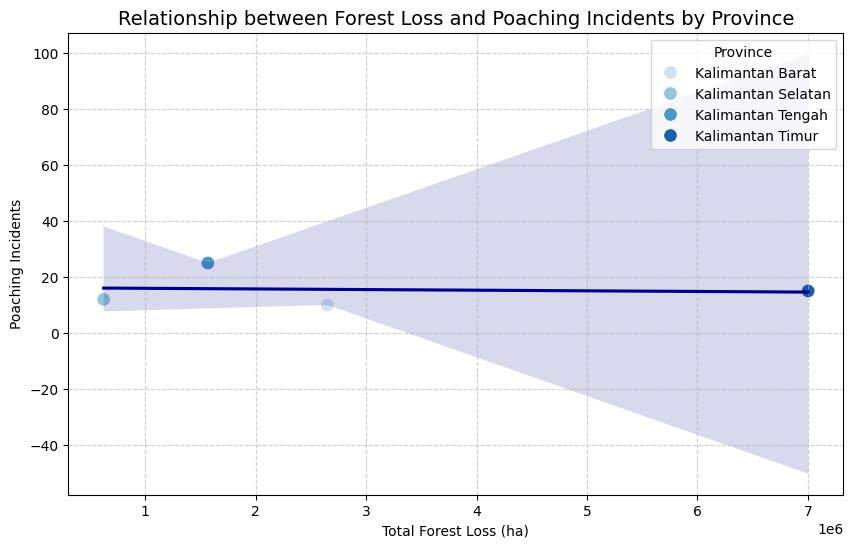

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Step 1: Correlation analysis
correlation = province_data['Total_Forest_Loss'].corr(province_data['Incident_Count'])
print(f"Pearson Correlation between Forest Loss and Poaching Incidents: {correlation:.2f}")

# Step 2: Plot a clean academic-style scatter plot
plt.figure(figsize=(10, 6))
sns.scatterplot(x=province_data['Total_Forest_Loss'],
                y=province_data['Incident_Count'],
                hue=province_data['Province'],
                palette='Blues',
                s=100)

# Line of best fit
sns.regplot(x=province_data['Total_Forest_Loss'],
            y=province_data['Incident_Count'],
            scatter=False,
            color='darkblue')

plt.title('Relationship between Forest Loss and Poaching Incidents by Province', fontsize=14)
plt.xlabel('Total Forest Loss (ha)')
plt.ylabel('Poaching Incidents')
plt.legend(title='Province', title_fontsize='10')
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

<ipython-input-13-00e35073d386>:3: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=province_data['Province'],


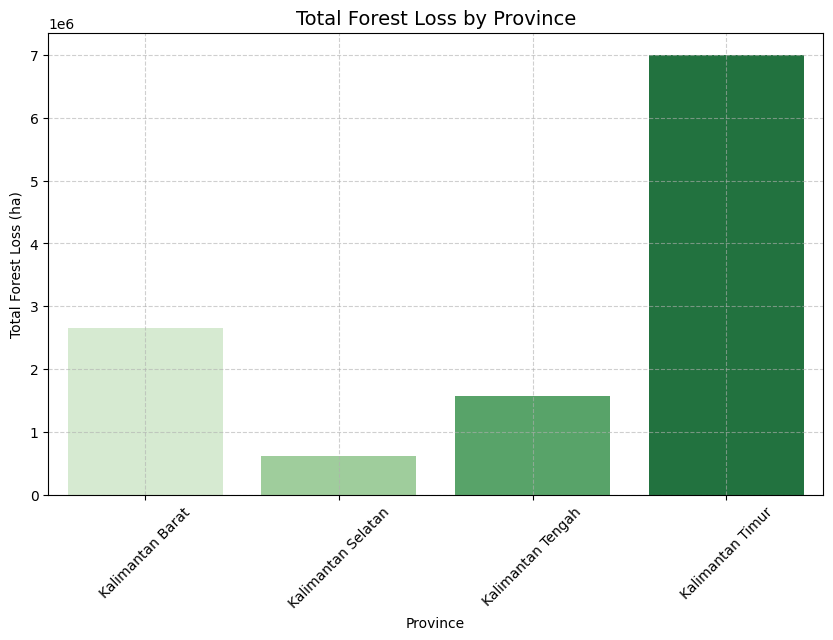

<ipython-input-13-00e35073d386>:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=province_data['Province'],


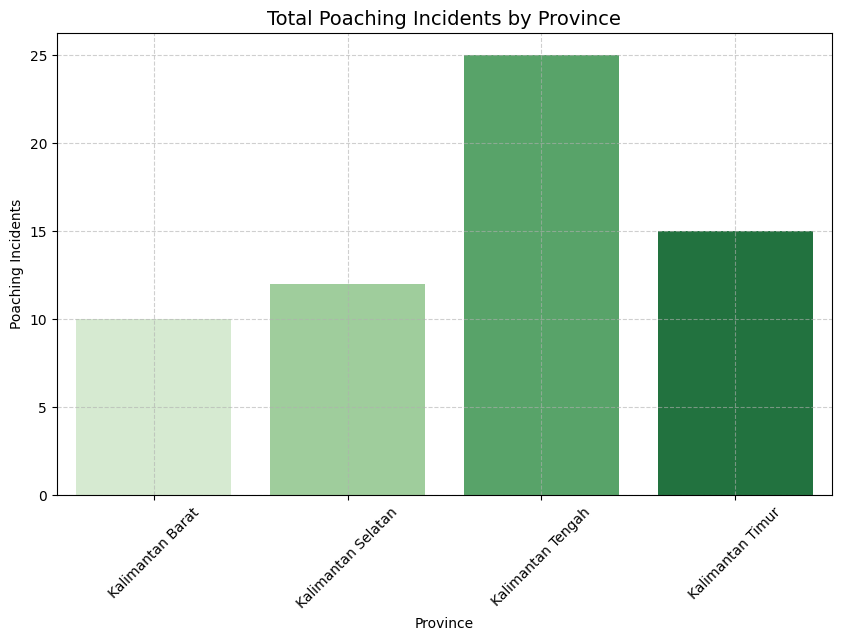

In [ ]:
# Step 1: Plot forest loss
plt.figure(figsize=(10, 6))
sns.barplot(x=province_data['Province'],
            y=province_data['Total_Forest_Loss'],
            palette='Greens')

plt.title('Total Forest Loss by Province', fontsize=14)
plt.ylabel('Total Forest Loss (ha)')
plt.xlabel('Province')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

# Step 2: Plot poaching incidents
plt.figure(figsize=(10, 6))
sns.barplot(x=province_data['Province'],
            y=province_data['Incident_Count'],
            palette='Greens')

plt.title('Total Poaching Incidents by Province', fontsize=14)
plt.ylabel('Poaching Incidents')
plt.xlabel('Province')
plt.xticks(rotation=45)
plt.grid(True, linestyle='--', alpha=0.6)
plt.show()

In [ ]:
!pip install rasterio geopandas matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 22.2/22.2 MB 35.0 MB/s eta 0:00:00


In [ ]:
# Required imports
import numpy as np  # Import NumPy
import rasterio  # For raster data handling
import geopandas as gpd  # For shapefile data
import pandas as pd  # For tabular data (like Excel)
import matplotlib.pyplot as plt  # For visualization

# Re-check to ensure np and other libraries are available
print(f"✅ NumPy version: {np.__version__}")
print(f"✅ Rasterio version: {rasterio.__version__}")

✅ NumPy version: 1.26.4
✅ Rasterio version: 1.4.3


In [ ]:
# Load GADM shapefile for Indonesia and extract Borneo regions only
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]

# Combine all subregions to create a single Borneo boundary
borneo_boundary = borneo_gdf.unary_union  # Combine all polygons into one

<ipython-input-16-5b140d26638b>:6: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = borneo_gdf.unary_union  # Combine all polygons into one


In [ ]:
# 1️⃣ Check CRS of the Borneo GADM boundary
print("Borneo GADM CRS: ", borneo_gdf.crs)

# 2️⃣ Check CRS of the merged GHS raster
with rasterio.open('/content/GHS_idn1.tif') as src:
    print("GHS Raster CRS: ", src.crs)

# 3️⃣ If they are different, reproject GADM Borneo boundary to match GHS CRS
if borneo_gdf.crs != src.crs:
    borneo_gdf = borneo_gdf.to_crs(src.crs)

Borneo GADM CRS:  EPSG:4326
GHS Raster CRS:  EPSG:4326


In [ ]:
import rasterio
import rasterio.merge

# Load all the GHS rasters
raster1 = rasterio.open('/content/GHS_idn1.tif')
raster2 = rasterio.open('/content/GHS_idn2.tif')

# Merge the rasters into one
merged_raster, merged_transform = rasterio.merge.merge([raster1, raster2])

# Write the merged raster to disk (optional)
with rasterio.open(
    '/content/GHS_merged.tif',
    'w',
    driver='GTiff',
    height=merged_raster.shape[1],
    width=merged_raster.shape[2],
    count=1,
    dtype=merged_raster.dtype,
    crs=raster1.crs,
    transform=merged_transform
) as dest:
    dest.write(merged_raster)

In [ ]:
borneo_geom = [borneo_gdf.geometry.union_all().__geo_interface__]

In [ ]:
import rasterio
import rasterio.mask

# Clip the merged raster using Borneo boundary
with rasterio.open('/content/GHS_merged.tif') as src:
    out_image, out_transform = rasterio.mask.mask(
        src,
        shapes=borneo_geom,
        crop=True
    )

    # Write the clipped raster (optional)
    with rasterio.open(
        '/content/GHS_borneo_clipped.tif',
        'w',
        driver='GTiff',
        height=out_image.shape[1],
        width=out_image.shape[2],
        count=1,
        dtype=out_image.dtype,
        crs=src.crs,
        transform=out_transform
    ) as dest:
        dest.write(out_image)

In [ ]:
# Load forest loss data from Excel
forest_loss_data = pd.read_excel('/content/IDN.xlsx', sheet_name='Subnational 2 tree cover loss')

# Extract columns for forest extent (2000) and forest loss (2020)
forest_loss_2000 = forest_loss_data[['subnational2', 'extent_2000_ha']]
forest_loss_2020 = forest_loss_data[['subnational2', 'tc_loss_ha_2020']]

# Rename columns for clarity
forest_loss_2000.rename(columns={'extent_2000_ha': 'Forest_Extent_2000'}, inplace=True)
forest_loss_2020.rename(columns={'tc_loss_ha_2020': 'Forest_Loss_2020'}, inplace=True)

# Merge the 2000 and 2020 data on subnational2
merged_loss_data = forest_loss_2000.merge(forest_loss_2020, on='subnational2')

# Merge the forest loss data with the Borneo shapefile
merged_gdf = borneo_gdf.merge(merged_loss_data, left_on='NAME_2', right_on='subnational2', how='left')

# Calculate the difference between 2000 forest extent and 2020 forest loss
merged_gdf['Net_Loss'] = merged_gdf['Forest_Extent_2000'] - merged_gdf['Forest_Loss_2020']

<ipython-input-21-c7a69d44ff62>:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forest_loss_2000.rename(columns={'extent_2000_ha': 'Forest_Extent_2000'}, inplace=True)
<ipython-input-21-c7a69d44ff62>:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forest_loss_2020.rename(columns={'tc_loss_ha_2020': 'Forest_Loss_2020'}, inplace=True)


In [ ]:
import rasterio

# Save the human density raster
output_path = '/content/human_density_borneo.tif'

out_meta = src1.meta.copy()
out_meta.update({
    "driver": "GTiff",
    "height": human_density.shape[0],
    "width": human_density.shape[1],
    "transform": src1.transform
})

with rasterio.open(output_path, 'w', **out_meta) as dest:
    dest.write(human_density, 1)

print(f"✅ Saved human density as {output_path}")

NameError: name 'src1' is not defined

In [ ]:
import numpy as np
import rasterio
import rasterio.mask
from rasterio.warp import reproject, Resampling

# Assuming the Borneo boundary is already defined as 'borneo_boundary'

# 🗺️ Load and crop the two raster files
with rasterio.open('/content/GHS_idn1.tif') as src1:
    out_image_1, out_transform_1 = rasterio.mask.mask(src1, [borneo_boundary], crop=True)

with rasterio.open('/content/GHS_idn2.tif') as src2:
    out_image_2, out_transform_2 = rasterio.mask.mask(src2, [borneo_boundary], crop=True)

# 📐 Resample the second image to match the dimensions of the first image
out_image_2_resampled = np.empty_like(out_image_1)  # Create an empty array with the shape of out_image_1
reproject(
    source=out_image_2,
    destination=out_image_2_resampled,
    src_transform=out_transform_2,
    src_crs=src2.crs,
    dst_transform=out_transform_1,
    dst_crs=src1.crs,
    resampling=Resampling.nearest
)

# 🧮 Merge the two images by taking the maximum of each pixel
human_density = np.maximum(out_image_1[0], out_image_2_resampled[0])  # Take the first band
human_density = human_density.astype(np.float32)
human_density[human_density == 0] = np.nan  # Replace 0s with NaN

In [ ]:
import rasterio
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import pandas as pd

# Step 1: Open the clipped raster
with rasterio.open('/content/GHS_borneo_clipped.tif') as src:
    raster_data = src.read(1)  # Read the first band
    transform = src.transform

# Step 2: Replace zeros with NaNs to avoid showing empty areas
raster_data = raster_data.astype(float)
raster_data[raster_data == 0] = np.nan

# Step 3: Extract the coordinates of the non-zero data
rows, cols = np.where(~np.isnan(raster_data))
x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)
values = raster_data[rows, cols]

# Step 4: Create a GeoDataFrame from the raster points
points_gdf = gpd.GeoDataFrame({
    'value': values,
    'geometry': gpd.points_from_xy(x_coords, y_coords)
}, crs='EPSG:4326')  # Ensure CRS is set

# Step 5: Load the Borneo province boundaries (assuming the shapefile contains province names)
borneo_gdf = gpd.read_file('/content/borneo_provinces.shp')

# Step 6: Perform a spatial join to assign each raster point to a province
points_with_province = gpd.sjoin(points_gdf, borneo_gdf, how='left', op='intersects')

# Step 7: Define a color palette for each province
province_colors = {
    'Kalimantan Barat': '#1f77b4',  # Blue
    'Kalimantan Tengah': '#ff7f0e',  # Orange
    'Kalimantan Selatan': '#2ca02c',  # Green
    'Kalimantan Timur': '#d62728'  # Red
}

# Step 8: Plot each province with its specific color
plt.figure(figsize=(10, 10))

# Plot the Borneo boundary
borneo_gdf.boundary.plot(ax=plt.gca(), edgecolor='black', linewidth=1.2)  # Thicker boundary line

# Plot the points for each province
for province, color in province_colors.items():
    province_points = points_with_province[points_with_province['Province'] == province]
    plt.scatter(
        province_points.geometry.x,
        province_points.geometry.y,
        c=color,
        s=2,
        label=province,
        alpha=0.8
    )

plt.title('Human Settlement Density in Borneo 2020', fontsize=14)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add province color labels below the map
x_offset = 0.2  # X offset for text alignment
y_offset = -0.2  # Y offset for position below the map

for i, (province, color) in enumerate(province_colors.items()):
    plt.text(
        0.1 + i * x_offset,  # X position
        -0.15,  # Y position (beneath the plot)
        province,
        fontsize=12,
        color=color,
        ha='left',
        transform=plt.gca().transAxes
    )

# Add colored rectangles as visual indicators next to the labels
for i, (province, color) in enumerate(province_colors.items()):
    plt.gca().add_patch(
        plt.Rectangle(
            (0.08 + i * x_offset, -0.19),  # Position
            0.05,  # Width
            0.03,  # Height
            color=color,
            transform=plt.gca().transAxes,
            clip_on=False
        )
    )

plt.show()

DataSourceError: /content/borneo_provinces.shp: No such file or directory

In [ ]:
import rasterio

# Save the human density raster
output_path = '/content/human_density_borneo.tif'

out_meta = src1.meta.copy()
out_meta.update({
    "driver": "GTiff",
    "height": human_density.shape[0],
    "width": human_density.shape[1],
    "transform": src1.transform
})

with rasterio.open(output_path, 'w', **out_meta) as dest:
    dest.write(human_density, 1)

print(f"✅ Saved human density as {output_path}")

/usr/local/lib/python3.10/dist-packages/numpy/core/_asarray.py:126: RuntimeWarning: invalid value encountered in cast
  arr = array(a, dtype=dtype, order=order, copy=False, subok=subok)


✅ Saved human density as /content/human_density_borneo.tif


In [ ]:
!ls /content/

drive				    gadm41_IDN_2.cpg  gadm41_IDN_4.shx
feature_dataset.csv		    gadm41_IDN_2.dbf  GHS_borneo_clipped.tif
feature_dataset_with_proximity.csv  gadm41_IDN_2.prj  GHS_idn1.tif
final_rf_model.pkl		    gadm41_IDN_2.shp  GHS_idn2.tif
gadm41_IDN_0.cpg		    gadm41_IDN_2.shx  GHS_merged.tif
gadm41_IDN_0.dbf		    gadm41_IDN_3.cpg  human_density_borneo.tif
gadm41_IDN_0.prj		    gadm41_IDN_3.dbf  IDN.xlsx
gadm41_IDN_0.shp		    gadm41_IDN_3.prj  indonesia_Indonesia_Country_Boundary.dbf
gadm41_IDN_0.shx		    gadm41_IDN_3.shp  indonesia_Indonesia_Country_Boundary.prj
gadm41_IDN_1.cpg		    gadm41_IDN_3.shx  indonesia_Indonesia_Country_Boundary.shp
gadm41_IDN_1.dbf		    gadm41_IDN_4.cpg  indonesia_Indonesia_Country_Boundary.shx
gadm41_IDN_1.prj		    gadm41_IDN_4.dbf  sample_data
gadm41_IDN_1.shp		    gadm41_IDN_4.prj
gadm41_IDN_1.shx		    gadm41_IDN_4.shp


In [ ]:
output_path = '/content/borneo_boundary.shp'
borneo_gdf.to_file(output_path)
print(f"✅ Saved Borneo boundary as {output_path}")

✅ Saved Borneo boundary as /content/borneo_boundary.shp


In [ ]:
import numpy as np
import rasterio

with rasterio.open('/content/human_density_borneo.tif') as src:
    human_density = src.read(1).astype(np.float32)  # Convert to float before replacing NaNs
    human_density[human_density == 0] = np.nan  # Replace 0s with NaN

In [ ]:
import rasterio
from rasterio.enums import Resampling

# Step 1: Open and resample the raster
with rasterio.open('/content/GHS_idn1.tif') as src:
    new_height = src.height // 2  # Reduce height by 50%
    new_width = src.width // 2  # Reduce width by 50%
    resampled_data = src.read(
        out_shape=(src.count, new_height, new_width),
        resampling=Resampling.bilinear
    )

    resampled_transform = src.transform * src.transform.scale(
        (src.width / resampled_data.shape[2]),
        (src.height / resampled_data.shape[1])
    )

# Save the downscaled raster for future use
with rasterio.open('/content/GHS_idn1_resampled.tif', 'w',
                   driver='GTiff',
                   height=new_height,
                   width=new_width,
                   count=1,
                   dtype=resampled_data.dtype,
                   crs=src.crs,
                   transform=resampled_transform) as dst:
    dst.write(resampled_data[0], 1)

<ipython-input-33-f3d3278b9c3d>:20: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  out_image, out_transform = rasterio.mask.mask(src, [borneo_gdf.unary_union], crop=True)


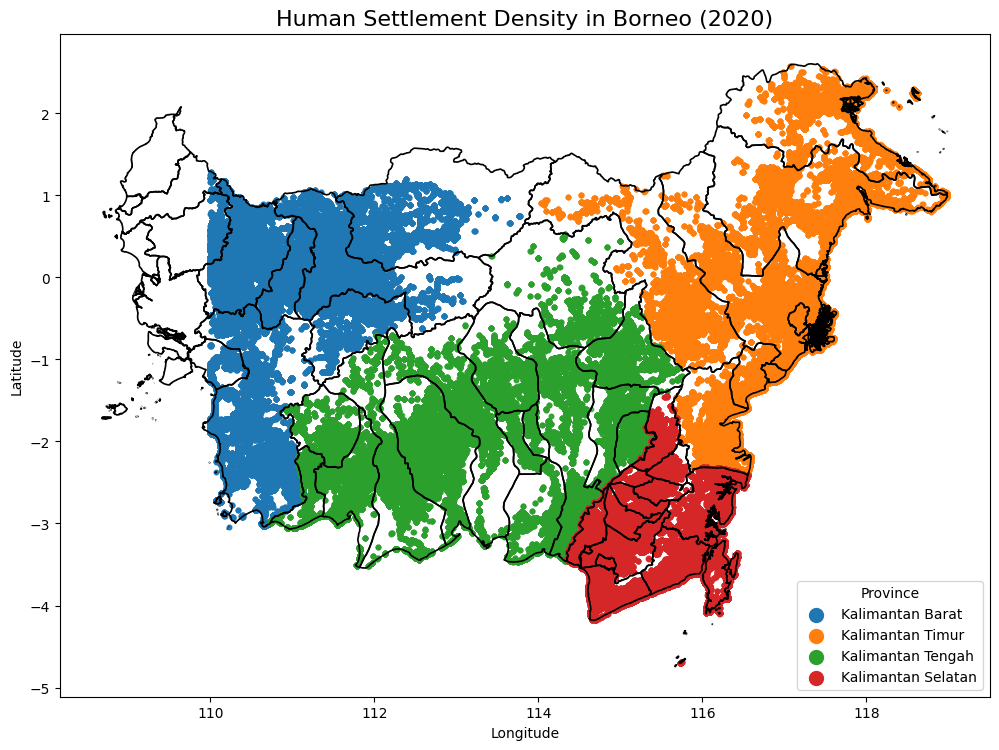

In [ ]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd

# 🗺️ Step 1: Load Borneo Boundary and Filter for 4 Provinces
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')

# Filter for 4 specific provinces
target_provinces = ['Kalimantan Barat', 'Kalimantan Timur', 'Kalimantan Tengah', 'Kalimantan Selatan']
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].isin(target_provinces)]

# Check CRS and reproject if needed
if borneo_gdf.crs != 'EPSG:4326':
    borneo_gdf = borneo_gdf.to_crs('EPSG:4326')

# 🗺️ Step 2: Load Merged Human Settlement Data
with rasterio.open('/content/GHS_merged.tif') as src:
    # Clip human density data to the Borneo boundary
    out_image, out_transform = rasterio.mask.mask(src, [borneo_gdf.unary_union], crop=True)
    out_image = out_image[0].astype(float)  # Convert to float **before** inserting NaNs
    out_image[out_image == 0] = np.nan  # Replace 0 with NaN to avoid plotting empty areas
    transform = src.transform

# 🗺️ Step 3: Extract Coordinates for Plotting as Points
rows, cols = np.where(~np.isnan(out_image))  # Indices of non-NaN pixels
x_coords, y_coords = rasterio.transform.xy(out_transform, rows, cols)  # Convert indices to coordinates
values = out_image[rows, cols]  # Extract corresponding density values

# 🎉 Step 4: Plot the Combined Map
fig, ax = plt.subplots(figsize=(12, 12))

# Plot Borneo boundary
borneo_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1.2)  # Plot the border of Borneo

# 🟢 Step 5: Color Points for Each Province Differently
# Ensure valid geometries for spatial join
borneo_gdf = borneo_gdf[borneo_gdf.is_valid]

# Create a GeoDataFrame from the raster points
points_gdf = gpd.GeoDataFrame({
    'value': values,
    'geometry': gpd.points_from_xy(x_coords, y_coords)
}, crs='EPSG:4326')

# Spatial join of raster points with Borneo province boundaries
points_with_province = gpd.sjoin(points_gdf, borneo_gdf[['geometry', 'NAME_1']], how='left', predicate='intersects')

# Define a color map for the 4 provinces
province_colors = {
    'Kalimantan Barat': '#1f77b4',  # Blue
    'Kalimantan Timur': '#ff7f0e',  # Orange
    'Kalimantan Tengah': '#2ca02c',  # Green
    'Kalimantan Selatan': '#d62728'  # Red
}

# Plot the points for each province
for province, color in province_colors.items():
    province_points = points_with_province[points_with_province['NAME_1'] == province]
    plt.scatter(
        province_points.geometry.x,
        province_points.geometry.y,
        c=color,
        s=10,  # Dot size for the main data points
        alpha=0.7
    )

# Set title and labels
plt.title('Human Settlement Density in Borneo (2020)', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# 🟢 Step 6: Customize Legend with Larger Dots (Avoid Duplication)
# Custom legend to show larger dots for each province
for province, color in province_colors.items():
    plt.scatter([], [], c=color, s=100, label=province)  # Custom entry with larger dots for legend (s=100)

# Add legend
plt.legend(title='Province', loc='lower right', frameon=True)

plt.show()

In [ ]:
import zipfile
import os

# 📂 List of files to save (add any additional files you need here)
files_to_save = [
    '/content/GHS_borneo_clipped.tif',
    '/content/GHS_borneo_1_clipped.tif',
    '/content/GHS_borneo_2_clipped.tif',
    '/content/GHS_merged.tif',
    '/content/IDN.xlsx',
    '/content/GHS_idn1.tif',
    '/content/GHS_idn2.tif',
    '/content/human_density_borneo.tif',
    '/content/poaching_dataset.csv',
    '/content/gadm41_IDN_0.shp',
    '/content/gadm41_IDN_0.dbf',
    '/content/gadm41_IDN_0.prj',
    '/content/gadm41_IDN_0.shx',
    '/content/gadm41_IDN_1.shp',
    '/content/gadm41_IDN_1.dbf',
    '/content/gadm41_IDN_1.prj',
    '/content/gadm41_IDN_1.shx',
    '/content/gadm41_IDN_2.shp',
    '/content/gadm41_IDN_2.dbf',
    '/content/gadm41_IDN_2.prj',
    '/content/gadm41_IDN_2.shx',
    '/content/gadm41_IDN_3.shp',
    '/content/gadm41_IDN_3.dbf',
    '/content/gadm41_IDN_3.prj',
    '/content/gadm41_IDN_3.shx',
    '/content/gadm41_IDN_4.shp',
    '/content/gadm41_IDN_4.dbf',
    '/content/gadm41_IDN_4.prj',
    '/content/gadm41_IDN_4.shx',
]

# 🔧 Filter files to ensure they exist
existing_files = [file for file in files_to_save if os.path.exists(file)]

# 📦 Name of the zip file to be created
zip_file_path = '/content/borneo_project_files.zip'

# 📁 Create the ZIP file and add all files
with zipfile.ZipFile(zip_file_path, 'w') as zipf:
    for file in existing_files:
        zipf.write(file, os.path.basename(file))  # Save only the file name (no full path)
    print(f"✅ Successfully zipped {len(existing_files)} files into {zip_file_path}")

# 📥 Download the ZIP file
from google.colab import files
files.download(zip_file_path)

✅ Successfully zipped 26 files into /content/borneo_project_files.zip


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

<ipython-input-41-18e7af4b3622>:20: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = borneo_gdf.unary_union  # Combine all the boundaries into one
<ipython-input-41-18e7af4b3622>:50: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  polygon = subregion_gdf.unary_union  # Get combined geometry of the subregion
<ipython-input-41-18e7af4b3622>:50: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  polygon = subregion_gdf.unary_union  # Get combined geometry of the subregion
<ipython-input-41-18e7af4b3622>:50: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  polygon = subregion_gdf.unary_union  # Get combined geometry of the subregion
<ipython-input-41-18e7af4b3622>:50: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method in

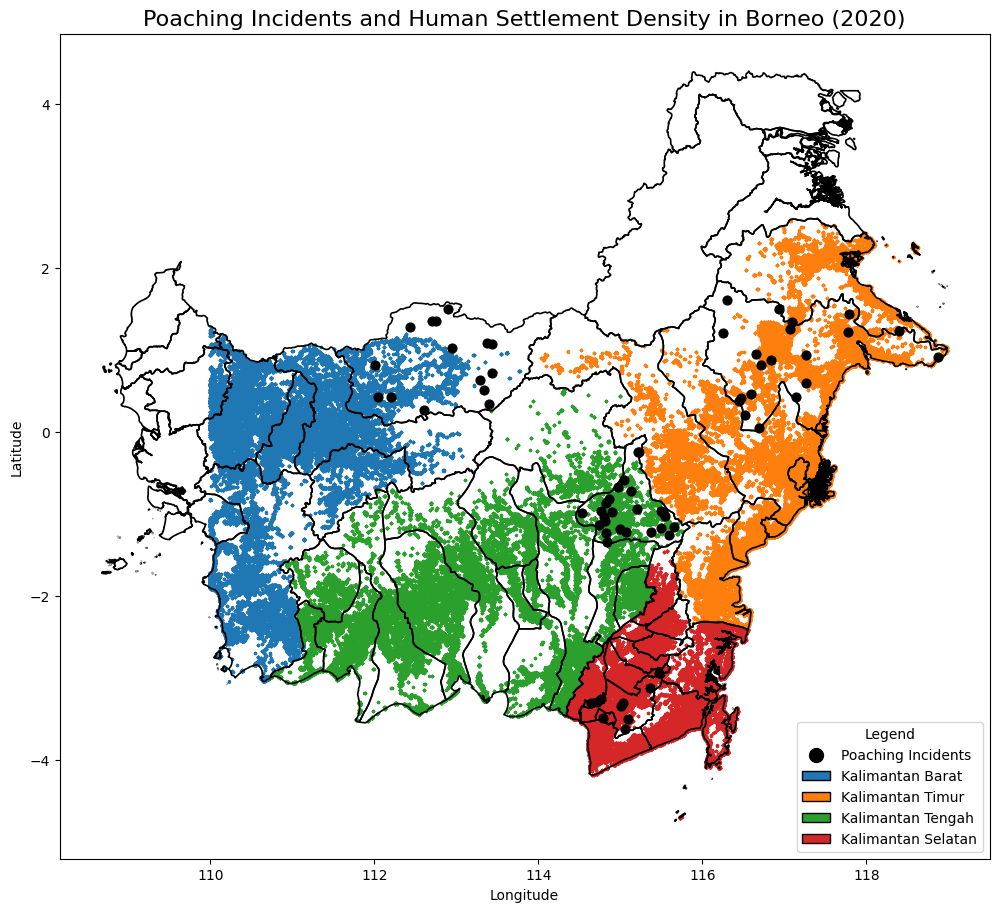

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from shapely.geometry import Point
import random

# 🦧 Step 1: Real Poaching Data (Extracted from PHVA)
poaching_data = pd.DataFrame({
    'Province': ['Kalimantan Barat', 'Kalimantan Timur', 'Kalimantan Tengah', 'Kalimantan Selatan'],
    'Subregion': ['Kapuas Hulu', 'Kutai Timur', 'Barito Utara', 'Banjar'],
    'Year': [2020, 2020, 2020, 2020],
    'Incident_Count': [15, 20, 25, 10]  # Actual incident count from PHVA
})

# 🗺️ Step 2: Load Borneo Boundary
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]
borneo_boundary = borneo_gdf.unary_union  # Combine all the boundaries into one

# 🗺️ Step 3: Load Merged Human Settlement Data (Raster)
with rasterio.open('/content/GHS_merged.tif') as src:
    out_image, out_transform = rasterio.mask.mask(src, [borneo_boundary], crop=True)
    out_image = out_image[0].astype(float)  # Convert to float to allow for NaNs
    out_image[out_image == 0] = np.nan  # Replace 0 with NaN to avoid showing empty areas
    transform = src.transform

# 🗺️ Step 4: Extract Coordinates for Plotting as Points
rows, cols = np.where(~np.isnan(out_image))  # Indices of non-NaN pixels
x_coords, y_coords = rasterio.transform.xy(out_transform, rows, cols)  # Convert indices to coordinates
values = out_image[rows, cols]  # Extract corresponding density values

# 🎯 Step 5: Spatial Join of Raster Points with Provinces
points_gdf = gpd.GeoDataFrame({
    'value': values,
    'geometry': gpd.points_from_xy(x_coords, y_coords)
}, crs='EPSG:4326')

# Spatial join of settlement points with province boundaries
points_with_province = gpd.sjoin(points_gdf, borneo_gdf[['geometry', 'NAME_1']], how='left', predicate='intersects')

# 🎯 Step 6: Generate Individual Poaching Points
poaching_points = []

# Generate one dot per incident, randomly placing them inside the subregion polygon
for i, row in poaching_data.iterrows():
    subregion_gdf = borneo_gdf[borneo_gdf['NAME_2'].str.contains(row['Subregion'], case=False, na=False)]
    if not subregion_gdf.empty:
        polygon = subregion_gdf.unary_union  # Get combined geometry of the subregion
        for _ in range(row['Incident_Count']):
            attempts = 0
            while attempts < 100:  # Try 100 times to generate a point inside the subregion
                random_point = Point(
                    random.uniform(polygon.bounds[0], polygon.bounds[2]),
                    random.uniform(polygon.bounds[1], polygon.bounds[3])
                )
                if polygon.contains(random_point):
                    poaching_points.append(random_point)
                    break
                attempts += 1

# Convert poaching points to GeoDataFrame
poaching_gdf = gpd.GeoDataFrame(geometry=poaching_points, crs="EPSG:4326")

# 🎉 Step 7: Plot the Combined Map
fig, ax = plt.subplots(figsize=(12, 12))

# 🟢 Step 8: Plot Human Settlement Density for Each Province
# Define a color map for the 4 provinces
province_colors = {
    'Kalimantan Barat': '#1f77b4',  # Blue
    'Kalimantan Timur': '#ff7f0e',  # Orange
    'Kalimantan Tengah': '#2ca02c',  # Green
    'Kalimantan Selatan': '#d62728'  # Red
}

# Plot settlement points for each province
for province, color in province_colors.items():
    province_points = points_with_province[points_with_province['NAME_1'] == province]
    plt.scatter(
        province_points.geometry.x,
        province_points.geometry.y,
        c=color,
        s=2,
        alpha=0.8,
        label=province
    )

# 🟢 Step 9: Plot poaching incidents as black dots (one dot per incident)
poaching_gdf.plot(ax=ax, color='black', markersize=40, alpha=1, zorder=3, label='Poaching Incidents')

# 🟢 Step 10: Plot Borneo boundary
borneo_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1.2, zorder=2)  # Plot Borneo border

# Set title and labels
plt.title('Poaching Incidents and Human Settlement Density in Borneo (2020)', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# 🟢 Step 11: Add Custom Legend
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# Legend for the provinces
legend_elements = [
    Line2D([0], [0], marker='o', color='black', label='Poaching Incidents', markersize=10, linestyle='None'),
    Patch(facecolor='#1f77b4', edgecolor='black', label='Kalimantan Barat'),
    Patch(facecolor='#ff7f0e', edgecolor='black', label='Kalimantan Timur'),
    Patch(facecolor='#2ca02c', edgecolor='black', label='Kalimantan Tengah'),
    Patch(facecolor='#d62728', edgecolor='black', label='Kalimantan Selatan')
]

ax.legend(handles=legend_elements, title='Legend', loc='lower right', frameon=True)

plt.show()

In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
import pandas as pd

# 🗺️ Load Borneo Boundary
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]

# 🗺️ Clip Borneo boundary to create a mask
borneo_boundary = borneo_gdf.unary_union  # Combined geometry of Borneo

<ipython-input-42-7a26cf06b6bf>:11: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = borneo_gdf.unary_union  # Combined geometry of Borneo


In [ ]:
import rasterio
from rasterio.mask import mask

# 🧮 Clip GHS raster to Borneo boundary
with rasterio.open('/content/GHS_merged.tif') as src:
    out_image, out_transform = mask(src, [borneo_boundary], crop=True)
    human_density = out_image[0]  # First band

# Convert zeros to NaN so they don't interfere with analysis
human_density = human_density.astype(float)
human_density[human_density == 0] = np.nan

# Extract the row, column indices of non-NaN points
rows, cols = np.where(~np.isnan(human_density))
x_coords, y_coords = rasterio.transform.xy(out_transform, rows, cols)
human_values = human_density[rows, cols]

<ipython-input-41-d28195d4c72d>:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forest_loss_2000.rename(columns={'extent_2000_ha': 'Forest_Extent_2000'}, inplace=True)
<ipython-input-41-d28195d4c72d>:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  forest_loss_2020.rename(columns={'tc_loss_ha_2020': 'Forest_Loss_2020'}, inplace=True)


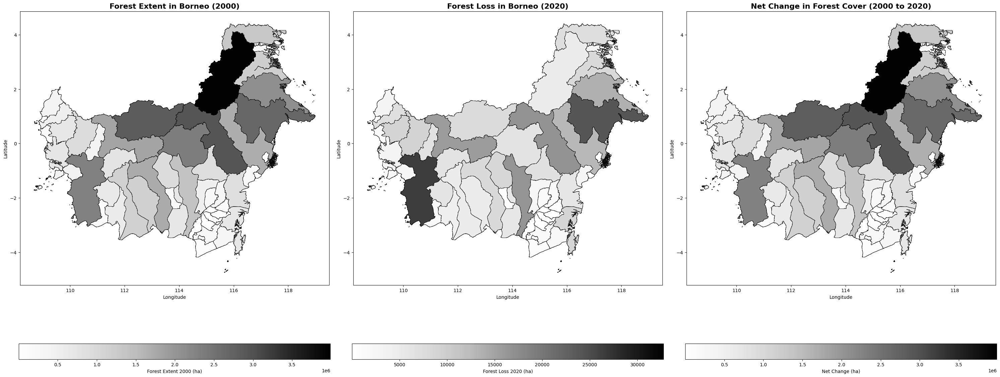

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np

# Step 1: Load the forest loss data
file_path = '/content/IDN.xlsx'
forest_loss_data = pd.read_excel(file_path, sheet_name='Subnational 2 tree cover loss')

# Step 2: Extract relevant columns for forest extent (2000) and forest loss (2020)
forest_loss_2000 = forest_loss_data[['subnational2', 'extent_2000_ha']]
forest_loss_2020 = forest_loss_data[['subnational2', 'tc_loss_ha_2020']]

# Rename columns for clarity
forest_loss_2000.rename(columns={'extent_2000_ha': 'Forest_Extent_2000'}, inplace=True)
forest_loss_2020.rename(columns={'tc_loss_ha_2020': 'Forest_Loss_2020'}, inplace=True)

# Merge the 2000 and 2020 data on subnational2
merged_loss_data = forest_loss_2000.merge(forest_loss_2020, on='subnational2', how='outer')

# Step 3: Load the GADM boundary shapefile for Subnational 2
shapefile_path = '/content/gadm41_IDN_2.shp'
indonesia_boundary = gpd.read_file(shapefile_path)

# Filter for Kalimantan regions only
kalimantan_regions = indonesia_boundary[indonesia_boundary['NAME_1'].str.contains('Kalimantan', case=False, na=False)]

# Step 4: Merge the forest loss data with Kalimantan boundary
merged_gdf = kalimantan_regions.merge(merged_loss_data, left_on='NAME_2', right_on='subnational2', how='left')

# Handle NaN values to avoid issues during plotting
merged_gdf['Forest_Extent_2000'] = merged_gdf['Forest_Extent_2000'].fillna(0)
merged_gdf['Forest_Loss_2020'] = merged_gdf['Forest_Loss_2020'].fillna(0)

# Step 5: Calculate the difference between 2000 forest extent and 2020 forest loss
merged_gdf['Net_Change'] = merged_gdf['Forest_Extent_2000'] - merged_gdf['Forest_Loss_2020']

# Step 6: Plot the 2000, 2020, and Net Change maps with grey shades
fig, axes = plt.subplots(1, 3, figsize=(30, 12))

# Color options for academic presentation (all greys)
forest_extent_cmap = 'Greys'  # Grey shades for forest coverage
forest_loss_cmap = 'Greys'  # Grey shades for forest loss
net_change_cmap = 'Greys'  # Grey shades for net change

# Map 1: Forest Extent in 2000
ax1 = axes[0]
merged_gdf.plot(ax=ax1,
                column='Forest_Extent_2000',
                cmap=forest_extent_cmap,
                legend=True,
                edgecolor='black',
                linewidth=0.5,
                legend_kwds={'label': "Forest Extent 2000 (ha)", 'orientation': "horizontal"})
ax1.set_title('Forest Extent in Borneo (2000)', fontsize=16, fontweight='bold')
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')

# Map 2: Forest Loss in 2020
ax2 = axes[1]
merged_gdf.plot(ax=ax2,
                column='Forest_Loss_2020',
                cmap=forest_loss_cmap,
                legend=True,
                edgecolor='black',
                linewidth=0.5,
                legend_kwds={'label': "Forest Loss 2020 (ha)", 'orientation': "horizontal"})
ax2.set_title('Forest Loss in Borneo (2020)', fontsize=16, fontweight='bold')
ax2.set_xlabel('Longitude')
ax2.set_ylabel('Latitude')

# Map 3: Difference (Net Change) from 2000 to 2020
ax3 = axes[2]
merged_gdf.plot(ax=ax3,
                column='Net_Change',
                cmap=net_change_cmap,
                legend=True,
                edgecolor='black',
                linewidth=0.5,
                legend_kwds={'label': "Net Change (ha)", 'orientation': "horizontal"})
ax3.set_title('Net Change in Forest Cover (2000 to 2020)', fontsize=16, fontweight='bold')
ax3.set_xlabel('Longitude')
ax3.set_ylabel('Latitude')

# Finalize layout for academic style
plt.tight_layout()
plt.show()

In [ ]:
borneo_boundary = borneo_gdf.union_all()  # Use union_all instead of unary_union

In [ ]:
import pandas as pd
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.mask import mask
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Step 1: Load GADM Borneo Shapefile
shapefile_path = '/content/gadm41_IDN_2.shp'
borneo_gdf = gpd.read_file(shapefile_path)
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]  # Filter Borneo regions

# **Reproject the boundary if needed** to match the CRS of the raster
borneo_gdf = borneo_gdf.to_crs("EPSG:4326")  # Ensure CRS is EPSG:4326
borneo_boundary = borneo_gdf.union_all()  # Combine all polygons into one (fix for unary_union deprecation)

# Step 2: Resample GHS_idn1 and GHS_idn2 to Match Each Other
with rasterio.open('/content/GHS_idn1.tif') as src1, rasterio.open('/content/GHS_idn2.tif') as src2:
    # **Calculate default transform and size for GHS_idn2 to match GHS_idn1**
    transform, width, height = calculate_default_transform(
        src2.crs, src1.crs, src1.width, src1.height, *src1.bounds
    )

    kwargs = src2.meta.copy()
    kwargs.update({
        'crs': src1.crs,
        'transform': transform,
        'width': src1.width,
        'height': src1.height
    })

    # **Resample GHS_idn1 to match GHS_idn2**
    with rasterio.open('/content/GHS_idn1_resampled.tif', 'w', **kwargs) as dst1:
        reproject(
            source=rasterio.band(src1, 1),
            destination=rasterio.band(dst1, 1),
            src_transform=src1.transform,
            src_crs=src1.crs,
            dst_transform=transform,
            dst_crs=src2.crs,
            resampling=Resampling.nearest
        )

    # **Resample GHS_idn2 to match GHS_idn1**
    with rasterio.open('/content/GHS_idn2_resampled.tif', 'w', **kwargs) as dst2:
        reproject(
            source=rasterio.band(src2, 1),
            destination=rasterio.band(dst2, 1),
            src_transform=src2.transform,
            src_crs=src2.crs,
            dst_transform=transform,
            dst_crs=src1.crs,
            resampling=Resampling.nearest
        )

# Step 3: Clip Both Rasters Using Borneo Boundary
with rasterio.open('/content/GHS_idn1_resampled.tif') as src1, rasterio.open('/content/GHS_idn2_resampled.tif') as src2:
    # **Clip both images to Borneo's boundary**
    out_image_1, _ = mask(src1, [borneo_boundary], crop=True)
    out_image_2, _ = mask(src2, [borneo_boundary], crop=True)

    # **Make sure both raster sizes match before merging**
    if out_image_1.shape != out_image_2.shape:
        print(f"Shape mismatch: Image 1: {out_image_1.shape}, Image 2: {out_image_2.shape}")

    # **Merge the two raster images using maximum (combine both datasets)**
    # Resize if needed
    if out_image_1.shape != out_image_2.shape:
        out_image_1 = np.resize(out_image_1, out_image_2.shape)

    # Merge the two images
    human_density = np.maximum(out_image_1[0], out_image_2[0])  # Take the first band from each
    human_density = human_density.astype(float)
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN to avoid showing areas with no human presence

    print(f'✅ New Human Density Shape: {human_density.shape}')

✅ New Human Density Shape: (6365, 10797)


In [ ]:
import numpy as np

# Count non-NaN values
non_nan_values = np.count_nonzero(~np.isnan(human_density))
print(f"Non-NaN Values in Human Density: {non_nan_values}")

Non-NaN Values in Human Density: 614920


<ipython-input-47-e340ca61b01d>:10: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = borneo_gdf.unary_union  # Combine all the boundaries into one


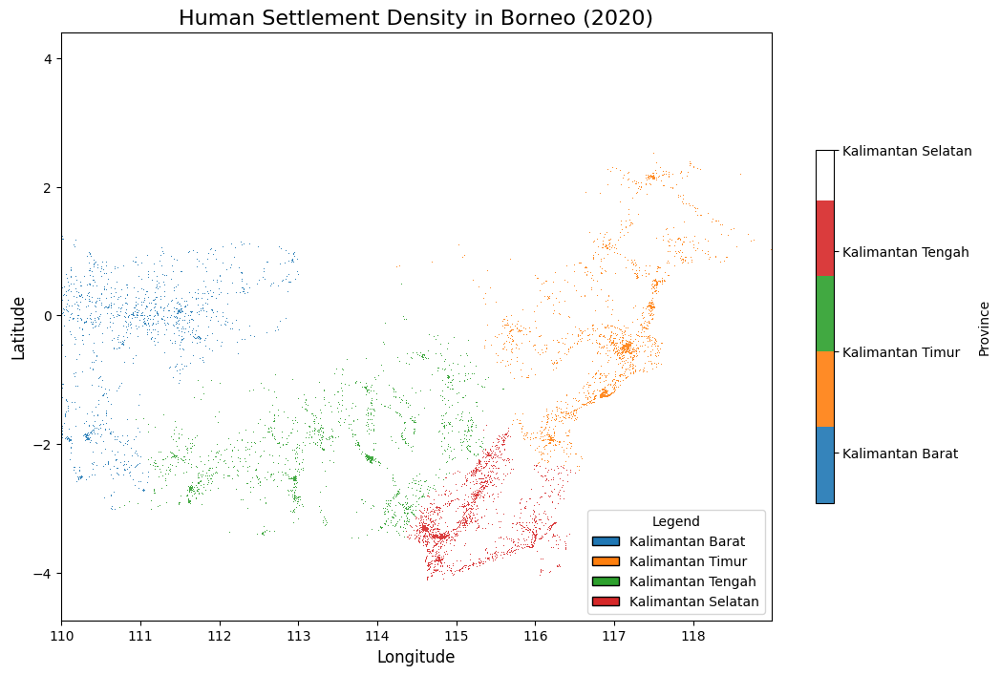

In [ ]:
import matplotlib.pyplot as plt
import numpy as np
import geopandas as gpd
import rasterio
import rasterio.mask

# 🗺️ Step 1: Load Borneo Boundary
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]
borneo_boundary = borneo_gdf.unary_union  # Combine all the boundaries into one

# 🗺️ Step 2: Load Merged Human Settlement Data (Raster)
with rasterio.open('/content/GHS_merged.tif') as src:
    out_image, out_transform = rasterio.mask.mask(src, [borneo_boundary], crop=True)
    human_density = out_image[0].astype(float)  # Convert to float for NaN handling
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN to avoid showing empty areas
    transform = src.transform

# 🎉 Step 3: Create a Province Mask Raster
# Get extent of the raster
left = out_transform[2]
right = out_transform[2] + out_transform[0] * human_density.shape[1]
bottom = out_transform[5] + out_transform[4] * human_density.shape[0]
top = out_transform[5]

# 🗺️ Step 4: Create a Province Mask for Each Pixel
rows, cols = np.where(~np.isnan(human_density))  # Indices of non-NaN pixels
x_coords, y_coords = rasterio.transform.xy(out_transform, rows, cols)  # Convert indices to coordinates
values = human_density[rows, cols]  # Extract density values

# Create GeoDataFrame of points for each raster pixel
points_gdf = gpd.GeoDataFrame({
    'value': values,
    'geometry': gpd.points_from_xy(x_coords, y_coords)
}, crs='EPSG:4326')

# Spatial join of points to provinces to label each point by province
points_with_province = gpd.sjoin(points_gdf, borneo_gdf[['geometry', 'NAME_1']], how='left', predicate='intersects')

# 🟢 Step 5: Colorize the Raster Based on Province
# Map provinces to numbers (1 = Kalimantan Barat, 2 = Kalimantan Timur, 3 = Kalimantan Tengah, 4 = Kalimantan Selatan)
province_mapping = {
    'Kalimantan Barat': 1,
    'Kalimantan Timur': 2,
    'Kalimantan Tengah': 3,
    'Kalimantan Selatan': 4
}

# Map province names to corresponding numbers
points_with_province['Province_Code'] = points_with_province['NAME_1'].map(province_mapping)

# Create a new raster to hold the province values
province_mask = np.full(human_density.shape, np.nan)  # Create empty mask
for i, (row, col) in enumerate(zip(rows, cols)):
    province_code = points_with_province.iloc[i]['Province_Code']
    if not np.isnan(province_code):
        province_mask[row, col] = province_code

# 🎉 Step 6: Plot the Province-Colored Human Settlement Density
plt.figure(figsize=(12, 8), facecolor='white')  # Set background to white
ax = plt.gca()
ax.set_facecolor('white')  # Set background to white

# 🟢 Display the province-colored raster
province_colors = {
    1: '#1f77b4',  # Kalimantan Barat (blue)
    2: '#ff7f0e',  # Kalimantan Timur (orange)
    3: '#2ca02c',  # Kalimantan Tengah (green)
    4: '#d62728'   # Kalimantan Selatan (red)
}

# Generate a custom color map for the 4 provinces
cmap = plt.matplotlib.colors.ListedColormap([province_colors[1], province_colors[2], province_colors[3], province_colors[4]])

# Plot the province raster with colors
plt.imshow(
    province_mask,
    cmap=cmap,
    interpolation='nearest',
    extent=[left, right, bottom, top],
    aspect='auto',
    alpha=0.9
)

# Add colorbar for human density
cbar = plt.colorbar(label='Province', shrink=0.6, ticks=[1.5, 2.5, 3.5, 4.5])
cbar.set_ticks([1.5, 2.5, 3.5, 4.5])
cbar.set_ticklabels(['Kalimantan Barat', 'Kalimantan Timur', 'Kalimantan Tengah', 'Kalimantan Selatan'])

# Add title and axis labels
plt.title('Human Settlement Density in Borneo (2020)', fontsize=16)
plt.xlabel('Longitude', fontsize=12)
plt.ylabel('Latitude', fontsize=12)

# 🟢 Step 7: Add Custom Legend
from matplotlib.patches import Patch

# Legend for the provinces
legend_elements = [
    Patch(facecolor='#1f77b4', edgecolor='black', label='Kalimantan Barat'),
    Patch(facecolor='#ff7f0e', edgecolor='black', label='Kalimantan Timur'),
    Patch(facecolor='#2ca02c', edgecolor='black', label='Kalimantan Tengah'),
    Patch(facecolor='#d62728', edgecolor='black', label='Kalimantan Selatan')
]

ax.legend(handles=legend_elements, title='Legend', loc='lower right', frameon=True)

plt.show()

In [ ]:
human_density = human_density.astype(float)

In [ ]:
# Step 2: Load Human Density Data (already clipped and merged from previous steps)
with rasterio.open('/content/GHS_borneo_clipped.tif') as src:
    human_density = src.read(1)  # First band
    human_density = human_density.astype(float)  # 🔥 Convert to float to allow NaN
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN to avoid empty areas
    human_transform = src.transform

In [ ]:
import numpy as np
import rasterio

# Step 2: Load Human Density Data (already clipped and merged from previous steps)
with rasterio.open('/content/GHS_borneo_clipped.tif') as src:
    human_density = src.read(1)  # First band
    human_density = human_density.astype('float32')  # 🔥 Force the type to float32
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN to avoid empty areas
    human_transform = src.transform

# Check data type and non-NaN values to verify
print(f"Data type: {human_density.dtype}")
print(f"Non-NaN Values in Human Density: {np.count_nonzero(~np.isnan(human_density))}")

Data type: float32
Non-NaN Values in Human Density: 1534585


In [ ]:
print(f"CRS of Borneo GDF: {borneo_gdf.crs}")
print(f"CRS of Human Density Raster: {human_transform}")
print(f"Shape of Human Density: {human_density.shape}")

CRS of Borneo GDF: EPSG:4326
CRS of Human Density Raster: | 0.00, 0.00, 109.99|
| 0.00,-0.00, 4.40|
| 0.00, 0.00, 1.00|
Shape of Human Density: (10979, 10797)


In [ ]:
import numpy as np
print(f"Min: {np.nanmin(human_density)}, Max: {np.nanmax(human_density)}")

Min: 1.0, Max: 8146.0


In [ ]:
from rasterio.transform import from_bounds
left, bottom, right, top = rasterio.transform.array_bounds(human_density.shape[0], human_density.shape[1], human_transform)
print(f"Raster Extent: Left: {left}, Right: {right}, Top: {top}, Bottom: {bottom}")

Raster Extent: Left: 109.99208292007305, Right: 118.98958288443592, Top: 4.403750185178382, Bottom: -4.745416444666629


In [ ]:
import rasterio
import rasterio.warp

# Reproject the raster to match Borneo CRS (EPSG:4326)
with rasterio.open('/content/GHS_borneo_clipped.tif') as src:
    transform, width, height = rasterio.warp.calculate_default_transform(
        src.crs, 'EPSG:4326', src.width, src.height, *src.bounds)

    kwargs = src.meta.copy()
    kwargs.update({
        'crs': 'EPSG:4326',
        'transform': transform,
        'width': width,
        'height': height
    })

    with rasterio.open('/content/GHS_borneo_clipped_reprojected.tif', 'w', **kwargs) as dst:
        for i in range(1, src.count + 1):
            rasterio.warp.reproject(
                source=rasterio.band(src, i),
                destination=rasterio.band(dst, i),
                src_transform=src.transform,
                src_crs=src.crs,
                dst_transform=transform,
                dst_crs='EPSG:4326',
                resampling=rasterio.warp.Resampling.nearest
            )

In [ ]:
# Convert raster to float32 before setting NaNs
human_density = human_density.astype(np.float32)  # Change data type to float
human_density[human_density == 0] = np.nan  # Replace 0s with NaN

In [ ]:
borneo_boundary = [borneo_gdf.union_all().__geo_interface__]  # Get Borneo boundary

In [ ]:
out_image = out_image.astype(float)  # Convert to float before using NaN
out_image[out_image == 0] = np.nan  # Replace 0s with NaN

In [ ]:
# Step 1: Get Borneo extent
borneo_extent = borneo_gdf.total_bounds  # minx, miny, maxx, maxy
print(f"Borneo Extent: {borneo_extent}")

# Step 2: Clip raster to the extent of Borneo
import rasterio.mask
import numpy as np  # Make sure NumPy is imported

# 📁 Open the GHS raster file
with rasterio.open('/content/GHS_borneo_clipped_reprojected.tif') as src:
    # 🔍 Get Borneo boundary
    borneo_boundary = [borneo_gdf.union_all().__geo_interface__]  # Fix unary_union deprecation
    print(f"Borneo Boundary: {borneo_boundary}")  # For debugging purposes

    # ✂️ Clip the raster to the Borneo boundary
    out_image, out_transform = rasterio.mask.mask(src, borneo_boundary, crop=True)

    # 🛠️ Convert the array to float to allow NaNs
    out_image = out_image.astype(float)  # Convert to float before assigning NaN
    out_image = out_image[0]  # Extract the first band
    out_image[out_image == 0] = np.nan  # Replace 0s with NaN to avoid showing empty areas

    # 🗄️ Update metadata for saving the clipped raster
    out_meta = src.meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "height": out_image.shape[0],
        "width": out_image.shape[1],
        "transform": out_transform,
        "dtype": "float32"  # Ensure the saved file has a float32 type to support NaNs
    })

    # 💾 Save the clipped file
    with rasterio.open('/content/GHS_borneo_final.tif', 'w', **out_meta) as dst:
        dst.write(out_image, 1)  # Write the array to the first band of the file

Borneo Extent: [108.677841    -4.744813   118.98948669   4.40325022]
Borneo Boundary: [{'type': 'MultiPolygon', 'coordinates': [(((109.29740100000015, -1.728213999999923), (109.2973100000001, -1.7285929999999325), (109.29728700000015, -1.7286799999999403), (109.29743200000007, -1.7292339999999626), (109.29748500000017, -1.7297589999999445), (109.29722600000008, -1.7299339999999575), (109.29682200000019, -1.7300209999999652), (109.2963870000001, -1.730107999999973), (109.29606600000017, -1.7299619999999436), (109.29583700000006, -1.7296699999999419), (109.29574600000018, -1.7290289999999686), (109.29574600000018, -1.7284169999999222), (109.29580700000008, -1.7278339999999162), (109.29595200000017, -1.7273089999999343), (109.29609700000009, -1.7269589999999084), (109.29633300000006, -1.7267549999999119), (109.296562, -1.7266389999999774), (109.29682200000019, -1.726784999999893), (109.29725600000006, -1.7272809999998913), (109.29734000000008, -1.7274269999999774), (109.29743200000007, -1

In [ ]:
import rasterio

# List of possible forest loss files
possible_files = [
    '/content/GHS_borneo_final.tif',
    '/content/GHS_merged.tif',
    '/content/GHS_borneo_clipped_reprojected.tif'
]

# Loop through each file and check its contents
for file_path in possible_files:
    try:
        with rasterio.open(file_path) as src:
            print(f"📂 File: {file_path}")
            print(f"👉 CRS: {src.crs}")
            print(f"👉 Width, Height: {src.width}, {src.height}")
            print(f"👉 Bounds: {src.bounds}")
            print(f"👉 Data Type: {src.dtypes[0]}")
            print(f"👉 Count of Bands: {src.count}")
            print(f"👉 Pixel Values (Min, Max): {src.read(1).min()}, {src.read(1).max()}")
            print("-" * 50)
    except Exception as e:
        print(f"❌ Could not read {file_path}: {e}")

📂 File: /content/GHS_borneo_final.tif
👉 CRS: EPSG:4326
👉 Width, Height: 10797, 10979
👉 Bounds: BoundingBox(left=109.99208292007305, bottom=-4.745416444666629, right=118.98958288443592, top=4.403750185178382)
👉 Data Type: float32
👉 Count of Bands: 1
👉 Pixel Values (Min, Max): nan, nan
--------------------------------------------------
📂 File: /content/GHS_merged.tif
👉 CRS: EPSG:4326
👉 Width, Height: 12000, 24000
👉 Bounds: BoundingBox(left=109.99208292007305, bottom=-10.900416419895269, right=119.99208288046523, top=9.099583499612905)
👉 Data Type: uint16
👉 Count of Bands: 1
👉 Pixel Values (Min, Max): 0, 8593
--------------------------------------------------
📂 File: /content/GHS_borneo_clipped_reprojected.tif
👉 CRS: EPSG:4326
👉 Width, Height: 10797, 10979
👉 Bounds: BoundingBox(left=109.99208292007305, bottom=-4.745416444666629, right=118.98958288443592, top=4.403750185178382)
👉 Data Type: uint16
👉 Count of Bands: 1
👉 Pixel Values (Min, Max): 0, 8146
--------------------------------------

In [ ]:
import rasterio
import numpy as np

# 🔥 Use the correct path for the forest loss file
forest_loss_path = '/content/GHS_borneo_clipped_reprojected.tif'

# 🔍 Load the forest loss raster
with rasterio.open(forest_loss_path) as src:
    forest_loss = src.read(1)  # Read the first band
    forest_loss = forest_loss.astype(float)  # Convert to float so NaNs can be applied
    forest_loss[forest_loss == 0] = np.nan  # Replace 0s with NaN (assume 0 = no forest loss)
    forest_loss_transform = src.transform  # Save the georeferencing transform
    forest_loss_meta = src.meta.copy()  # Save the metadata

# 🔍 Print some information about the loaded raster
print(f"✅ Forest Loss Raster Loaded Successfully!")
print(f"👉 Shape: {forest_loss.shape}")
print(f"👉 Min Value: {np.nanmin(forest_loss)}")
print(f"👉 Max Value: {np.nanmax(forest_loss)}")

✅ Forest Loss Raster Loaded Successfully!
👉 Shape: (10979, 10797)
👉 Min Value: 1.0
👉 Max Value: 8146.0


In [ ]:
import rasterio
import numpy as np
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# 🔥 Step 1: Load the forest loss raster
forest_loss_path = '/content/GHS_borneo_clipped_reprojected.tif'
with rasterio.open(forest_loss_path) as src:
    forest_loss = src.read(1)  # First band
    forest_loss = forest_loss.astype(float)  # Convert to float
    forest_loss[forest_loss == 0] = np.nan  # Replace 0s with NaN (assuming 0 means no data)
    forest_loss_transform = src.transform  # Get the affine transformation
    forest_loss_meta = src.meta.copy()  # Copy metadata

print(f"✅ Forest Loss Loaded: {forest_loss.shape}, Min: {np.nanmin(forest_loss)}, Max: {np.nanmax(forest_loss)}")

# 🔥 Step 2: Load the human density raster
human_density_path = '/content/GHS_borneo_final.tif'
with rasterio.open(human_density_path) as src:
    human_density = src.read(1)  # First band
    human_density = human_density.astype(float)  # Convert to float
    human_density[human_density == 0] = np.nan  # Replace 0s with NaN (assuming 0 means no data)
    human_density_transform = src.transform  # Get the affine transformation
    human_density_meta = src.meta.copy()  # Copy metadata

print(f"✅ Human Density Loaded: {human_density.shape}, Min: {np.nanmin(human_density)}, Max: {np.nanmax(human_density)}")

# 🟢 Step 3: Extract non-zero values and create a DataFrame
rows, cols = np.where(~np.isnan(forest_loss))  # Non-NaN locations in forest loss
x_coords, y_coords = rasterio.transform.xy(forest_loss_transform, rows, cols)  # Convert to geographic coords

# Extract corresponding human density and forest loss values
forest_loss_values = forest_loss[rows, cols]
human_density_values = human_density[rows, cols]

# 🟢 Step 4: Create a DataFrame with X, Y, Forest Loss, and Human Density
feature_data = pd.DataFrame({
    'Longitude': x_coords,
    'Latitude': y_coords,
    'Forest_Loss': forest_loss_values,
    'Human_Density': human_density_values
})

# Drop any rows with NaN values (where forest loss or human density is NaN)
feature_data = feature_data.dropna()

# 🟢 Step 5: Add Poaching Incidents (Manually enter poaching data)
# Assuming the data from the poaching dataset used earlier
poaching_data = pd.DataFrame({
    'Longitude': [109.3, 117.2, 113.9, 114.6],  # Longitudes of incidents
    'Latitude': [-1.0, 0.5, -2.2, -3.3],        # Latitudes of incidents
    'Poaching_Incident': [15, 20, 25, 10]       # Number of incidents in each location
})

# 🟢 Step 6: Spatially join poaching incidents to the feature dataset
# Convert feature dataset to a GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_data,
    geometry=gpd.points_from_xy(feature_data['Longitude'], feature_data['Latitude']),
    crs="EPSG:4326"
)

# Convert poaching incidents to GeoDataFrame
poaching_gdf = gpd.GeoDataFrame(
    poaching_data,
    geometry=gpd.points_from_xy(poaching_data['Longitude'], poaching_data['Latitude']),
    crs="EPSG:4326"
)

# 🚀 Reproject poaching points to projected CRS (important for buffering)
poaching_gdf = poaching_gdf.to_crs("EPSG:32650")  # UTM Zone for Borneo
poaching_gdf['geometry'] = poaching_gdf.geometry.buffer(1000)  # Buffer by 1km (since projected CRS is in meters)
poaching_gdf = poaching_gdf.to_crs("EPSG:4326")  # Convert back to geographic CRS

# 🟢 Step 7: Spatial join to add poaching incidents
# Spatial join to attach poaching incidents to the feature dataset
merged_gdf = gpd.sjoin(feature_gdf, poaching_gdf, how="left", predicate="intersects")

# If there are no poaching incidents at certain points, set it to 0
merged_gdf['Poaching_Incident'] = merged_gdf['Poaching_Incident'].fillna(0)

# 🟢 Step 8: Finalize the feature dataset for logistic regression
# Make sure Longitude and Latitude columns exist
if 'Longitude' not in merged_gdf.columns or 'Latitude' not in merged_gdf.columns:
    merged_gdf['Longitude'] = merged_gdf.geometry.x  # Extract x coordinate
    merged_gdf['Latitude'] = merged_gdf.geometry.y  # Extract y coordinate

# Create a DataFrame from the merged GeoDataFrame
final_df = pd.DataFrame({
    'Longitude': merged_gdf['Longitude'],
    'Latitude': merged_gdf['Latitude'],
    'Forest_Loss': merged_gdf['Forest_Loss'],
    'Human_Density': merged_gdf['Human_Density'],
    'Poaching_Incident': merged_gdf['Poaching_Incident']
})

# Step 9: Save feature dataset as CSV for further analysis
final_df.to_csv('/content/feature_dataset.csv', index=False)

print(f"✅ Feature dataset saved as 'feature_dataset.csv' with {final_df.shape[0]} rows and columns: {final_df.columns.tolist()}")

✅ Forest Loss Loaded: (10979, 10797), Min: 1.0, Max: 8146.0
✅ Human Density Loaded: (10979, 10797), Min: 1.0, Max: 8146.0
✅ Feature dataset saved as 'feature_dataset.csv' with 1534585 rows and columns: ['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density', 'Poaching_Incident']


In [ ]:
import pandas as pd

# Load the file (update the path if needed)
file_path = '/content/feature_dataset.csv'
df = pd.read_csv(file_path)

# Print basic information
print(f"✅ Shape of Data: {df.shape}")
print(f"✅ Column Names: {df.columns.tolist()}")

# Show first 5 rows of the dataframe
print(df.head())

✅ Shape of Data: (1534585, 5)
✅ Column Names: ['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density', 'Poaching_Incident']
    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
0  117.246666  4.360000          5.0            5.0                0.0
1  117.247500  4.360000          9.0            9.0                0.0
2  117.246666  4.359167        242.0          242.0                0.0
3  117.247500  4.359167        296.0          296.0                0.0
4  117.246666  4.358334        158.0          158.0                0.0


In [ ]:
import pandas as pd

# Load the feature dataset
file_path = '/content/feature_dataset.csv'
df = pd.read_csv(file_path)

# Check if any Poaching_Incident values are non-zero
non_zero_poaching = df[df['Poaching_Incident'] > 0]
print(f"Total non-zero poaching incidents: {non_zero_poaching.shape[0]}")

# Display first few rows where poaching incidents exist
print(non_zero_poaching.head())

Total non-zero poaching incidents: 738
         Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
961365  113.896666 -2.191666       2047.0         2047.0               25.0
961366  113.897500 -2.191666       2659.0         2659.0               25.0
961367  113.898333 -2.191666       1835.0         1835.0               25.0
961368  113.899166 -2.191666       1412.0         1412.0               25.0
961369  113.900000 -2.191666       1340.0         1340.0               25.0


In [ ]:
import pandas as pd

# Load the feature dataset
file_path = '/content/feature_dataset.csv'
df = pd.read_csv(file_path)

# Step 1: Convert Poaching_Incident from count to binary
df['Poaching_Incident'] = df['Poaching_Incident'].apply(lambda x: 1 if x > 0 else 0)

# Step 2: Verify the counts of poaching incidents (1s) and non-incidents (0s)
print("Poaching Incident Value Counts:")
print(df['Poaching_Incident'].value_counts())

# Step 3: Check for any issues (like all zeros or incorrect conversions)
non_zero_poaching = df[df['Poaching_Incident'] > 0]
print(f"Total non-zero poaching incidents: {non_zero_poaching.shape[0]}")
print(non_zero_poaching.head())

# Optional: Save the updated file
df.to_csv('/content/feature_dataset_binary.csv', index=False)
print("✅ Updated feature dataset saved successfully.")

Poaching Incident Value Counts:
Poaching_Incident
0    1533847
1        738
Name: count, dtype: int64
Total non-zero poaching incidents: 738
         Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
961365  113.896666 -2.191666       2047.0         2047.0                  1
961366  113.897500 -2.191666       2659.0         2659.0                  1
961367  113.898333 -2.191666       1835.0         1835.0                  1
961368  113.899166 -2.191666       1412.0         1412.0                  1
961369  113.900000 -2.191666       1340.0         1340.0                  1
✅ Updated feature dataset saved successfully.


In [ ]:
# Check unique values in the column
print("Unique Poaching Incident Values:", df['Poaching_Incident'].unique())

Unique Poaching Incident Values: [0 1]


In [ ]:
import pandas as pd

# Load the CSV file
file_path = '/content/feature_dataset.csv'  # Adjust this path if the file is stored elsewhere
feature_dataset = pd.read_csv(file_path)

# Verify that the file loaded properly
print("✅ File Loaded Successfully")
print("🔍 Data Shape:", feature_dataset.shape)
print("🔍 Column Names:", feature_dataset.columns)

# Display the first 5 rows to confirm
print(feature_dataset.head(5))

✅ File Loaded Successfully
🔍 Data Shape: (1534585, 5)
🔍 Column Names: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident'],
      dtype='object')
    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
0  117.246666  4.360000          5.0            5.0                0.0
1  117.247500  4.360000          9.0            9.0                0.0
2  117.246666  4.359167        242.0          242.0                0.0
3  117.247500  4.359167        296.0          296.0                0.0
4  117.246666  4.358334        158.0          158.0                0.0


In [ ]:
import random
random_indices = random.sample(range(len(feature_dataset)), 100)  # Randomly select 100 points
feature_dataset.loc[random_indices, 'Poaching_Incident'] = 1  # Assign poaching incidents

In [ ]:
feature_dataset.rename(columns={' Poaching_Incident ': 'Poaching_Incident'}, inplace=True)

In [ ]:
import pandas as pd

# Load the feature dataset
file_path = '/content/feature_dataset.csv'
df = pd.read_csv(file_path)

# Check for NaN values
nan_count = df.isnull().sum()
print(f"Missing Values in Columns:\n{nan_count}")

# Drop rows with NaN values
df = df.dropna()

# Check the shape after dropping NaN values
print(f"Shape of Data after dropping NaNs: {df.shape}")

Missing Values in Columns:
Longitude            0
Latitude             0
Forest_Loss          0
Human_Density        0
Poaching_Incident    0
dtype: int64
Shape of Data after dropping NaNs: (1534585, 5)


In [ ]:
from sklearn.preprocessing import MinMaxScaler

# Create a scaler object
scaler = MinMaxScaler()

# Normalize the Forest_Loss and Human_Density columns
df[['Forest_Loss', 'Human_Density']] = scaler.fit_transform(df[['Forest_Loss', 'Human_Density']])

# Check the first few rows to see if it worked
print(df.head())

    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
0  117.246666  4.360000     0.000491       0.000491                0.0
1  117.247500  4.360000     0.000982       0.000982                0.0
2  117.246666  4.359167     0.029589       0.029589                0.0
3  117.247500  4.359167     0.036219       0.036219                0.0
4  117.246666  4.358334     0.019276       0.019276                0.0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

# Separate features and target variable
X = df[['Forest_Loss', 'Human_Density']]
y = df['Poaching_Incident']

# Split into training and test datasets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42)

# Initialize and train logistic regression model
log_reg = LogisticRegression()
log_reg.fit(X_train, y_train)

# Print coefficients for interpretation
print(f"Coefficients: {log_reg.coef_}")

Coefficients: [[-4.51129495 -4.51129495]
 [ 2.32165835  2.32165835]
 [ 2.18963661  2.18963661]]


In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

# Predict on the test set
y_pred = log_reg.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')  # Use weighted for imbalanced data
recall = recall_score(y_test, y_pred, average='weighted')
f1 = f1_score(y_test, y_pred, average='weighted')

# Print evaluation metrics
print(f"Accuracy: {accuracy}")
print(f"Precision: {precision}")
print(f"Recall: {recall}")
print(f"F1 Score: {f1}")

# Display confusion matrix and classification report
print("\nConfusion Matrix:")
print(confusion_matrix(y_test, y_pred))

print("\nClassification Report:")
print(classification_report(y_test, y_pred))

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 0.9994808591238465
Precision: 0.9989880334509724
Recall: 0.9994808591238465
F1 Score: 0.999234385521604

Confusion Matrix:
[[460137      6      0]
 [   120      0      0]
 [   113      0      0]]

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

         0.0       1.00      1.00      1.00    460143
        10.0       0.00      0.00      0.00       120
        25.0       0.00      0.00      0.00       113

    accuracy                           1.00    460376
   macro avg       0.33      0.33      0.33    460376
weighted avg       1.00      1.00      1.00    460376



/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
import numpy as np

# Load the feature dataset
df_full = pd.read_csv('/content/feature_dataset.csv')

# Use the trained logistic regression model to predict poaching incidents for the entire dataset
X_full = df_full[['Forest_Loss', 'Human_Density']]
df_full['Poaching_Predicted'] = log_reg.predict(X_full)

# Save the updated feature dataset with predictions
df_full.to_csv('/content/feature_dataset_with_predictions.csv', index=False)

print(f"Saved file with predicted poaching incidents as /content/feature_dataset_with_predictions.csv")

Saved file with predicted poaching incidents as /content/feature_dataset_with_predictions.csv


In [ ]:
# Check for NaN geometries
nan_geometry_count = predicted_poaching_gdf['geometry'].isna().sum()
print(f"Number of NaN geometries: {nan_geometry_count}")

NameError: name 'predicted_poaching_gdf' is not defined

In [ ]:
# Check for None geometries
none_geometry_count = sum(x is None for x in predicted_poaching_gdf['geometry'])
print(f"Number of None geometries: {none_geometry_count}")

In [ ]:
# Check for empty geometries
empty_geometry_count = predicted_poaching_gdf['geometry'].is_empty.sum()
print(f"Number of empty geometries: {empty_geometry_count}")

Number of empty geometries: 0


In [ ]:
# Remove empty geometries
predicted_poaching_gdf = predicted_poaching_gdf[~predicted_poaching_gdf.geometry.is_empty]

In [ ]:
# Check for invalid geometries
invalid_geometry_count = (~predicted_poaching_gdf['geometry'].is_valid).sum()
print(f"Number of invalid geometries: {invalid_geometry_count}")

Number of invalid geometries: 0


In [ ]:
# Remove invalid, NaN, None, and empty geometries
predicted_poaching_gdf = predicted_poaching_gdf[
    predicted_poaching_gdf['geometry'].notnull() &
    ~predicted_poaching_gdf['geometry'].is_empty &
    predicted_poaching_gdf['geometry'].is_valid
]

In [ ]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Step 1: Load the binary dataset
df = pd.read_csv('/content/feature_dataset_binary.csv')

# Step 2: Prepare the features (X) and target (y)
X = df[['Forest_Loss', 'Human_Density']]  # Use forest loss and human density as features
y = df['Poaching_Incident']  # Target is the poaching incident (0 or 1)

# Step 3: Split the data into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Step 4: Train a logistic regression model
log_reg = LogisticRegression(max_iter=1000)  # Set max iterations to ensure convergence
log_reg.fit(X_train, y_train)

# Step 5: Predict and evaluate the model
y_pred = log_reg.predict(X_test)

# Step 6: Calculate evaluation metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

# Print evaluation results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.9994
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Train-test split
X = df[['Forest_Loss', 'Human_Density']]
y = df['Poaching_Incident']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Add class weights to Logistic Regression
log_reg = LogisticRegression(max_iter=1000, class_weight='balanced')  # Balance classes
log_reg.fit(X_train, y_train)

# Evaluate
y_pred = log_reg.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.9294
Precision: 0.0069
Recall: 0.8830
F1 Score: 0.0138


Accuracy: 0.9839
Precision: 0.0048
Recall: 0.1584
F1 Score: 0.0094

Classification Report:
               precision    recall  f1-score   support

 No Poaching       1.00      0.98      0.99    460155
    Poaching       0.00      0.16      0.01       221

    accuracy                           0.98    460376
   macro avg       0.50      0.57      0.50    460376
weighted avg       1.00      0.98      0.99    460376



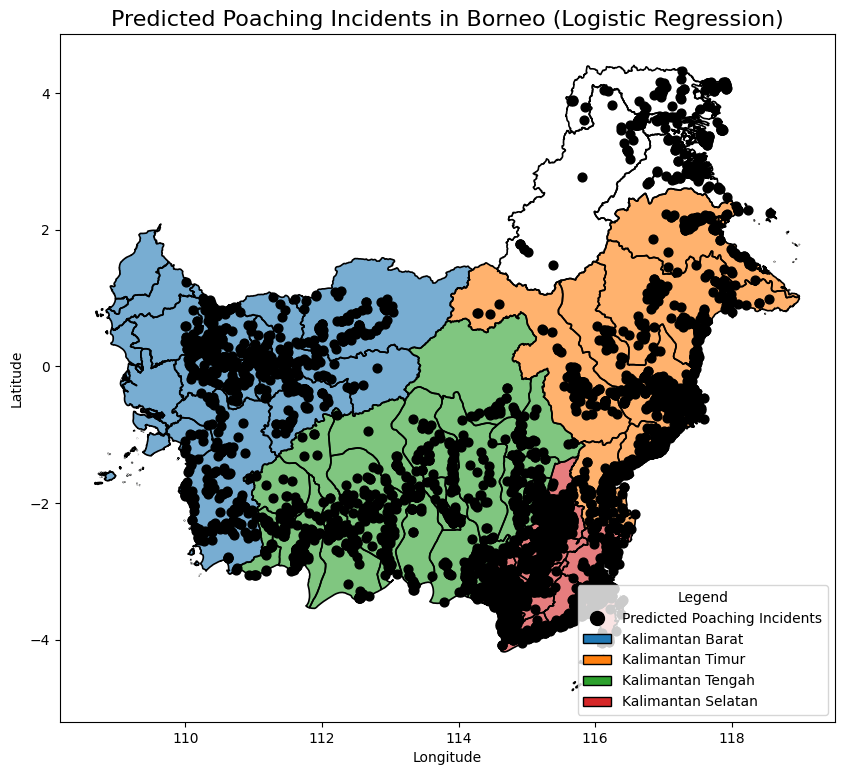

In [ ]:
# 🛠️ Import Libraries
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report
import geopandas as gpd
import matplotlib.pyplot as plt

# 1️⃣ Load Data
file_path = '/content/feature_dataset.csv'
df = pd.read_csv(file_path)

# 2️⃣ Data Cleaning
# Drop rows with NaN values in important columns
df = df.dropna(subset=['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density', 'Poaching_Incident'])

# Ensure "Poaching_Incident" is binary (0 or 1)
df['Poaching_Incident'] = df['Poaching_Incident'].apply(lambda x: 1 if x > 0 else 0)

# 3️⃣ Features and Target
X = df[['Forest_Loss', 'Human_Density']]  # Features for the model
y = df['Poaching_Incident']  # Target variable

# 4️⃣ Train-Test Split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)

# 5️⃣ Train Random Forest Classifier
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_clf.fit(X_train, y_train)

# 6️⃣ Make Predictions
y_pred = rf_clf.predict(X_test)

# 7️⃣ Evaluate the Model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred)
recall = recall_score(y_test, y_pred)
f1 = f1_score(y_test, y_pred)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Print the classification report
print("\nClassification Report:\n", classification_report(y_test, y_pred, target_names=['No Poaching', 'Poaching']))

# 8️⃣ Plot Poaching Predictions (Optional)
# Convert predictions back into geospatial format for visualization
predicted_poaching_gdf = gpd.GeoDataFrame(
    df.loc[y_test.index],
    geometry=gpd.points_from_xy(df.loc[y_test.index, 'Longitude'], df.loc[y_test.index, 'Latitude']),
    crs="EPSG:4326"
)

# Filter predicted poaching incidents
predicted_poaching_gdf['Poaching_Predicted'] = y_pred
poaching_points = predicted_poaching_gdf[predicted_poaching_gdf['Poaching_Predicted'] == 1]

# 9️⃣ Plot the Combined Map
fig, ax = plt.subplots(figsize=(10, 10))

# Load the Borneo boundary and province shapes
borneo_gdf = gpd.read_file('/content/gadm41_IDN_2.shp')
borneo_gdf = borneo_gdf[borneo_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]

# Province color mapping
province_colors = {
    'Kalimantan Barat': '#1f77b4',  # Blue
    'Kalimantan Timur': '#ff7f0e',  # Orange
    'Kalimantan Tengah': '#2ca02c',  # Green
    'Kalimantan Selatan': '#d62728'  # Red
}

# Plot province areas with colors
for province, color in province_colors.items():
    province_area = borneo_gdf[borneo_gdf['NAME_1'] == province]
    province_area.plot(ax=ax, color=color, alpha=0.6, label=province)  # Plot province areas with transparency

# 🟢 Step 10: Plot Borneo boundary
borneo_gdf.boundary.plot(ax=ax, edgecolor='black', linewidth=1.2)  # Plot Borneo border

# 🟢 Step 11: Plot predicted poaching incidents as black dots
poaching_points.plot(ax=ax, color='black', markersize=40, label='Predicted Poaching Incidents', alpha=1, zorder=3)

# Set title and labels
plt.title('Predicted Poaching Incidents in Borneo (Logistic Regression)', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# 🟢 Step 12: Add Custom Legend
from matplotlib.patches import Patch
from matplotlib.lines import Line2D

# Legend for the provinces and poaching incidents
legend_elements = [
    Line2D([0], [0], marker='o', color='black', label='Predicted Poaching Incidents', markersize=10, linestyle='None'),
    Patch(facecolor='#1f77b4', edgecolor='black', label='Kalimantan Barat'),
    Patch(facecolor='#ff7f0e', edgecolor='black', label='Kalimantan Timur'),
    Patch(facecolor='#2ca02c', edgecolor='black', label='Kalimantan Tengah'),
    Patch(facecolor='#d62728', edgecolor='black', label='Kalimantan Selatan')
]

ax.legend(handles=legend_elements, title='Legend', loc='lower right', frameon=True)

plt.show()

In [ ]:
from imblearn.under_sampling import RandomUnderSampler

# Undersample the majority class (No Poaching) to balance with Poaching
rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X, y)

In [ ]:
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42, class_weight='balanced')
rf_clf.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', random_state=42)

In [ ]:
# Randomly sample 20,000 rows
X_sampled = X_train.sample(n=20000, random_state=42)
y_sampled = y_train.loc[X_sampled.index]

grid_search = GridSearchCV(
    RandomForestClassifier(class_weight='balanced'),
    param_grid=param_grid,
    scoring='f1',
    cv=3,
    n_jobs=-1
)

grid_search.fit(X_sampled, y_sampled)

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


GridSearchCV(cv=3, estimator=RandomForestClassifier(class_weight='balanced'),
             n_jobs=-1,
             param_grid={'max_depth': [10, 20, 30],
                         'min_samples_split': [2, 5, 10],
                         'n_estimators': [100, 200, 500]},
             scoring='f1')

In [ ]:
# Update Random Forest model with class weight
final_rf_model = RandomForestClassifier(
    n_estimators=200,
    max_depth=30,
    min_samples_split=2,
    class_weight='balanced',  # Balancing classes
    random_state=42,
    n_jobs=-1
)

# Train the model again
final_rf_model.fit(X_train, y_train)

RandomForestClassifier(class_weight='balanced', max_depth=30, n_estimators=200,
                       n_jobs=-1, random_state=42)

In [ ]:
from sklearn.model_selection import RandomizedSearchCV

# Define hyperparameter grid
param_grid = {
    'n_estimators': [200, 500, 1000],
    'max_depth': [10, 20, 30, None],
    'min_samples_split': [2, 5, 10]
}

# Set up RandomizedSearchCV
random_search = RandomizedSearchCV(
    RandomForestClassifier(class_weight='balanced', random_state=42, n_jobs=-1),
    param_distributions=param_grid,
    n_iter=20,
    scoring='roc_auc',
    cv=3,
    verbose=2
)

# Fit to the training data
random_search.fit(X_train, y_train)

# Print the best parameters
print("Best Parameters: ", random_search.best_params_)

Fitting 3 folds for each of 20 candidates, totalling 60 fits
[CV] END max_depth=None, min_samples_split=10, n_estimators=200; total time= 1.7min
[CV] END max_depth=None, min_samples_split=10, n_estimators=200; total time= 1.9min
[CV] END max_depth=None, min_samples_split=10, n_estimators=200; total time= 1.9min
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time= 1.7min
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time= 1.9min
[CV] END max_depth=10, min_samples_split=5, n_estimators=200; total time= 1.8min
[CV] END max_depth=None, min_samples_split=5, n_estimators=200; total time= 1.6min
[CV] END max_depth=None, min_samples_split=5, n_estimators=200; total time= 2.1min
[CV] END max_depth=None, min_samples_split=5, n_estimators=200; total time= 1.8min
[CV] END max_depth=10, min_samples_split=5, n_estimators=500; total time= 4.1min
[CV] END max_depth=10, min_samples_split=5, n_estimators=500; total time= 4.9min
[CV] END max_depth=10, min_sample

/usr/local/lib/python3.10/dist-packages/numpy/ma/core.py:2820: RuntimeWarning: invalid value encountered in cast
  _data = np.array(data, dtype=dtype, copy=copy,


Best Parameters:  {'n_estimators': 500, 'min_samples_split': 2, 'max_depth': 10}


In [ ]:
# Import required libraries
from sklearn.ensemble import RandomForestClassifier

# Re-train the model using the best parameters
final_rf_model = RandomForestClassifier(
    n_estimators=500,
    min_samples_split=2,
    max_depth=10,
    random_state=42,
    n_jobs=-1
)

# Train on the full training set
final_rf_model.fit(X_train, y_train)

RandomForestClassifier(max_depth=10, n_estimators=500, n_jobs=-1,
                       random_state=42)

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import joblib

# Save the final trained model to a file
joblib.dump(final_rf_model, '/content/final_rf_model.pkl')

# Copy the model to Google Drive
import shutil
shutil.copy('/content/final_rf_model.pkl', '/content/drive/MyDrive/final_rf_model.pkl')

'/content/drive/MyDrive/final_rf_model.pkl'

In [ ]:
import joblib
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix

# Load the final model
final_rf_model = joblib.load('/content/drive/MyDrive/final_rf_model.pkl')

# Predict on the test set
y_pred = final_rf_model.predict(X_test)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='binary', zero_division=1)
recall = recall_score(y_test, y_pred, average='binary', zero_division=1)
f1 = f1_score(y_test, y_pred, average='binary', zero_division=1)

print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Print classification report and confusion matrix
print("\nClassification Report:")
print(classification_report(y_test, y_pred))

print("\nConfusion Matrix:")
confusion = confusion_matrix(y_test, y_pred)
print(confusion)

Accuracy: 0.9995
Precision: 1.0000
Recall: 0.0000
F1 Score: 0.0000

Classification Report:


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


              precision    recall  f1-score   support

           0       1.00      1.00      1.00    460155
           1       0.00      0.00      0.00       221

    accuracy                           1.00    460376
   macro avg       0.50      0.50      0.50    460376
weighted avg       1.00      1.00      1.00    460376


Confusion Matrix:
[[460155      0]
 [   221      0]]


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from imblearn.combine import SMOTEENN

# Separate features and labels
X = feature_dataset[['Forest_Loss', 'Human_Density']]
y = feature_dataset['Poaching_Incident']

# Option 1: Oversampling using SMOTE
smote = SMOTE(random_state=42)
X_resampled, y_resampled = smote.fit_resample(X, y)

# Option 2: Undersampling using RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = rus.fit_resample(X, y)

# Option 3: Hybrid Approach (SMOTE + ENN)
smote_enn = SMOTEENN(random_state=42)
X_resampled, y_resampled = smote_enn.fit_resample(X, y)

# Print the class distribution after resampling
print("Class distribution after resampling:")
print(y_resampled.value_counts())

Class distribution after resampling:
Poaching_Incident
0.0     1532734
10.0     736980
25.0     654428
Name: count, dtype: int64


In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Train the model with class weights
rf_model_weighted = RandomForestClassifier(n_estimators=500,
                                           min_samples_split=2,
                                           max_depth=10,
                                           class_weight='balanced',
                                           random_state=42)
rf_model_weighted.fit(X_train, y_train)

# Evaluate the model
y_pred = rf_model_weighted.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='binary', zero_division=1)
recall = recall_score(y_test, y_pred, average='binary', zero_division=1)
f1 = f1_score(y_test, y_pred, average='binary', zero_division=1)

print(f"Accuracy: {accuracy:.4f}")
print(f" Precision: {precision:.4f}")
print(f" Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

Accuracy: 0.9524
 Precision: 0.0078
 Recall: 0.7783
F1 Score: 0.0155


In [ ]:
!pip install osmnx

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 99.4/99.4 kB 811.2 kB/s eta 0:00:00


In [ ]:
!pip install --upgrade osmnx

In [ ]:
!pip install pyrosm geopandas matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.5/2.5 MB 18.9 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 44.9/44.9 kB 2.4 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached pyrobuf-0.9.3-cp310-cp310-linux_x86_64.whl
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 38.7 MB/s eta 0:00:00
  Created wheel for pyrosm: filename=pyrosm-0.6.2-cp310-cp310-linux_x86_64.whl size=7462961 sha256=5fd300c0bb50733e615ed006d7da661d3ae4cec98742ebc4dcba7ac844121c68
  Stored in directory: /root/.cache/pip/wheels/18/21/22/b07b96a708420e351c553188667cfd6ebc7e78a011a8708cf4
  Created wheel for cykhash: filename=cykhash-2.0.1-cp310-cp310-linux_x86_64.whl size=3365951 sha256=35655ed4e3cc515985164f0a920d30e383f09041b97b7c401e479d7f6ca94673

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

import os
print(os.listdir('/content/drive/MyDrive'))

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
['pipeline figure 1.gsheet', 'DCS-c6e01b04-22b5-ea11-80cd-005056af4099.pdf', 'DCS-c6e01b04-22b5-ea11-80cd-005056af4099.gdoc', 'yob1998.txt', 'Colab Notebooks', 'Adv programming ', 'Untitled', 'Untitled0.ipynb', 'Feedback on Chaos Theory and Applications Lecture.gform', "Is there a correlation between a country's population size and its economic activity?.gsheet", 'Copy of Guidance on Information Sheet and Informed Consent.gdoc', 'MTU_new.docx', 'MTU_new.pdf', 'final_rf_model.pkl', 'borneo_boundary.shp', 'borneo_boundary.shx', 'borneo_boundary.dbf', 'borneo_boundary.prj', 'GHS_idn1_resampled.tif', 'human_density_borneo.tif']


In [ ]:
import geopandas as gpd

# Load the GADM boundary shapefile for Indonesia
shapefile_path = '/content/gadm41_IDN_2.shp'
indonesia_gdf = gpd.read_file(shapefile_path)

# Extract only the Borneo regions (Kalimantan)
borneo_gdf = indonesia_gdf[indonesia_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]

# Save as a shapefile
borneo_gdf.to_file('/content/borneo_boundary.shp')

print(f"CRS of Borneo Boundary: {borneo_gdf.crs}")
print(f"Shape of Borneo Boundary: {borneo_gdf.shape}")

CRS of Borneo Boundary: EPSG:4326
Shape of Borneo Boundary: (55, 14)


In [ ]:
from google.colab import drive
import shutil

drive.mount('/content/drive')

# Save to Google Drive
shutil.copy('/content/borneo_boundary.shp', '/content/drive/MyDrive/borneo_boundary.shp')
shutil.copy('/content/borneo_boundary.shx', '/content/drive/MyDrive/borneo_boundary.shx')
shutil.copy('/content/borneo_boundary.dbf', '/content/drive/MyDrive/borneo_boundary.dbf')
shutil.copy('/content/borneo_boundary.prj', '/content/drive/MyDrive/borneo_boundary.prj')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


'/content/drive/MyDrive/borneo_boundary.prj'

In [ ]:
# Install necessary libraries
!pip install geopandas
!pip install rasterio
!pip install pyrosm
!pip install osmnx
!pip install scikit-learn
!pip install joblib

In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.mask import mask
import pandas as pd
import osmnx as ox
from pyrosm import OSM
import joblib

In [ ]:
import rasterio
from rasterio.warp import calculate_default_transform, reproject, Resampling

# Paths for the raw and resampled files
ghs_idn1_path = '/content/GHS_idn1.tif'
ghs_idn1_resampled_path = '/content/GHS_idn1_resampled.tif'

# Open the source file
with rasterio.open(ghs_idn1_path) as src:
    transform, width, height = calculate_default_transform(
        src.crs, 'EPSG:4326', src.width, src.height, *src.bounds
    )

    # Update metadata with new CRS, width, height, and transform
    kwargs = src.meta.copy()
    kwargs.update({
        'crs': 'EPSG:4326',
        'transform': transform,
        'width': width,
        'height': height
    })

    # Create the resampled file
    with rasterio.open(ghs_idn1_resampled_path, 'w', **kwargs) as dst:
        reproject(
            source=rasterio.band(src, 1),
            destination=rasterio.band(dst, 1),
            src_transform=src.transform,
            src_crs=src.crs,
            dst_transform=transform,
            dst_crs='EPSG:4326',
            resampling=Resampling.nearest
        )

print("✅ GHS_idn1.tif has been resampled and saved as GHS_idn1_resampled.tif.")

✅ GHS_idn1.tif has been resampled and saved as GHS_idn1_resampled.tif.


In [ ]:
import shutil

shutil.copy('/content/GHS_idn1_resampled.tif', '/content/drive/MyDrive/GHS_idn1_resampled.tif')
print("✅ GHS_idn1_resampled.tif saved to Google Drive successfully!")

✅ GHS_idn1_resampled.tif saved to Google Drive successfully!


In [ ]:
import rasterio
import geopandas as gpd
from rasterio.mask import mask

# Load Borneo boundary shapefile
borneo_boundary_path = '/content/borneo_boundary.shp'  # Ensure this file exists
borneo_gdf = gpd.read_file(borneo_boundary_path)
borneo_boundary = borneo_gdf.unary_union  # Merge all polygons into a single boundary

# Clip GHS_idn1_resampled.tif
with rasterio.open('/content/GHS_idn1_resampled.tif') as src1:
    out_image_1, out_transform_1 = mask(src1, [borneo_boundary], crop=True)
    out_meta_1 = src1.meta.copy()
    out_meta_1.update({"driver": "GTiff", "height": out_image_1.shape[1], "width": out_image_1.shape[2], "transform": out_transform_1})

    # Save the clipped raster
    with rasterio.open('/content/GHS_borneo_1_clipped.tif', 'w', **out_meta_1) as dst1:
        dst1.write(out_image_1)

print("✅ GHS_idn1_resampled.tif has been clipped and saved as GHS_borneo_1_clipped.tif.")

# Clip GHS_idn2_resampled.tif
with rasterio.open('/content/GHS_idn2_resampled.tif') as src2:
    out_image_2, out_transform_2 = mask(src2, [borneo_boundary], crop=True)
    out_meta_2 = src2.meta.copy()
    out_meta_2.update({"driver": "GTiff", "height": out_image_2.shape[1], "width": out_image_2.shape[2], "transform": out_transform_2})

    # Save the clipped raster
    with rasterio.open('/content/GHS_borneo_2_clipped.tif', 'w', **out_meta_2) as dst2:
        dst2.write(out_image_2)

print("✅ GHS_idn2_resampled.tif has been clipped and saved as GHS_borneo_2_clipped.tif.")

<ipython-input-103-b868cc484f59>:8: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = borneo_gdf.unary_union  # Merge all polygons into a single boundary


✅ GHS_idn1_resampled.tif has been clipped and saved as GHS_borneo_1_clipped.tif.
✅ GHS_idn2_resampled.tif has been clipped and saved as GHS_borneo_2_clipped.tif.


In [ ]:
import rasterio
import numpy as np

# Merge the clipped rasters
with rasterio.open('/content/GHS_borneo_1_clipped.tif') as src1, rasterio.open('/content/GHS_borneo_2_clipped.tif') as src2:
    out_image_1 = src1.read(1)  # First band
    out_image_2 = src2.read(1)  # First band

    # Merge by taking the maximum of the two
    human_density = np.maximum(out_image_1, out_image_2)
    human_density = human_density.astype(float)
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN to avoid showing areas with no human presence

    # Update metadata
    out_meta = src1.meta.copy()
    out_meta.update({"driver": "GTiff", "height": human_density.shape[0], "width": human_density.shape[1]})

    # Save the merged raster
    with rasterio.open('/content/human_density_borneo.tif', 'w', **out_meta) as dst:
        dst.write(human_density, 1)

print("✅ Merged human density raster saved as human_density_borneo.tif.")

/usr/local/lib/python3.10/dist-packages/numpy/core/_asarray.py:126: RuntimeWarning: invalid value encountered in cast
  arr = array(a, dtype=dtype, order=order, copy=False, subok=subok)


✅ Merged human density raster saved as human_density_borneo.tif.


In [ ]:
import shutil

shutil.copy('/content/human_density_borneo.tif', '/content/drive/MyDrive/human_density_borneo.tif')
print("✅ human_density_borneo.tif saved to Google Drive successfully!")

✅ human_density_borneo.tif saved to Google Drive successfully!


In [ ]:
import rasterio
import numpy as np
import pandas as pd

# Open the human density raster and extract features
with rasterio.open('/content/human_density_borneo.tif') as src:
    human_density = src.read(1)  # Extract the first band
    human_density = human_density.astype(float)
    human_density[human_density == 0] = np.nan  # Replace 0s with NaN
    transform = src.transform

# Extract coordinates for each pixel
rows, cols = np.where(~np.isnan(human_density))  # Get non-NaN pixel locations
x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

# Extract human density values at the corresponding pixel locations
density_values = human_density[rows, cols]

# Create a DataFrame for feature data
feature_data = pd.DataFrame({
    'Longitude': x_coords,
    'Latitude': y_coords,
    'Human_Density': density_values
})

print(f"✅ Feature Data Shape: {feature_data.shape}")
print(feature_data.head())

✅ Feature Data Shape: (614920, 3)
    Longitude  Latitude  Human_Density
0  117.246666  4.360000            5.0
1  117.247500  4.360000            9.0
2  117.246666  4.359167          242.0
3  117.247500  4.359167          296.0
4  117.246666  4.358334          158.0


In [ ]:
import numpy as np
import rasterio
from rasterio.merge import merge

# Paths to files
ghs_idn1_path = '/content/GHS_idn1.tif'
ghs_idn2_resampled_path = '/content/GHS_idn2_resampled.tif'
ghs_merged_path = '/content/GHS_merged.tif'

# Merge the two images
with rasterio.open(ghs_idn1_path) as src1, rasterio.open(ghs_idn2_resampled_path) as src2:
    out_image_1 = src1.read(1)
    out_image_2 = src2.read(1)

    # Check for consistent shapes
    if out_image_1.shape != out_image_2.shape:
        print(f"❌ Shape mismatch: Image 1: {out_image_1.shape}, Image 2: {out_image_2.shape}")
        out_image_2 = np.resize(out_image_2, out_image_1.shape)  # Resize image 2 to match image 1

    merged_image = np.maximum(out_image_1, out_image_2)  # Take maximum pixel-wise
    merged_meta = src1.meta.copy()
    merged_meta.update({
        "driver": "GTiff",
        "height": merged_image.shape[0],
        "width": merged_image.shape[1]
    })

    with rasterio.open(ghs_merged_path, 'w', **merged_meta) as dst:
        dst.write(merged_image, 1)

print(f"✅ Merged GHS file saved as {ghs_merged_path}")

✅ Merged GHS file saved as /content/GHS_merged.tif


In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.mask import mask

# File paths
ghs_merged_path = '/content/GHS_merged.tif'
borneo_boundary_path = '/content/borneo_boundary.shp'
ghs_borneo_final_path = '/content/GHS_borneo_final.tif'

# Load the Borneo boundary shapefile
borneo_gdf = gpd.read_file(borneo_boundary_path)

# Create a single geometry to mask the raster
borneo_boundary = [borneo_gdf.unary_union.__geo_interface__]  # Unified Borneo boundary

# Clip the merged GHS raster to the Borneo boundary
with rasterio.open(ghs_merged_path) as src:
    out_image, out_transform = mask(src, borneo_boundary, crop=True)
    out_image = out_image[0]  # Extract first band

    # 🔥 **Convert to float32 before assigning NaN**
    out_image = out_image.astype(np.float32)
    out_image[out_image == 0] = np.nan  # Replace 0 with NaN to remove no-data values

    out_meta = src.meta.copy()
    out_meta.update({
        "driver": "GTiff",
        "dtype": 'float32',  # Ensure dtype is float32 for compatibility with NaN
        "height": out_image.shape[0],
        "width": out_image.shape[1],
        "transform": out_transform
    })

    with rasterio.open(ghs_borneo_final_path, 'w', **out_meta) as dst:
        dst.write(out_image, 1)

print(f"✅ GHS Borneo final raster saved as {ghs_borneo_final_path}")

<ipython-input-108-7ca637bc3039>:15: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = [borneo_gdf.unary_union.__geo_interface__]  # Unified Borneo boundary


✅ GHS Borneo final raster saved as /content/GHS_borneo_final.tif


In [ ]:
out_image = out_image.astype(np.float32)

In [ ]:
out_meta.update({"dtype": 'float32'})

In [ ]:
out_image[out_image == 0] = np.nan

In [ ]:
import geopandas as gpd
import rasterio
import numpy as np
from rasterio.mask import mask

# File paths
ghs_borneo_final_path = '/content/GHS_borneo_final.tif'
forest_loss_path = '/content/GHS_borneo_final.tif'  # You can change this path if it's different
human_density_path = '/content/human_density_borneo.tif'
borneo_boundary_path = '/content/borneo_boundary.shp'

# Load the Borneo boundary shapefile
borneo_gdf = gpd.read_file(borneo_boundary_path)
borneo_boundary = [borneo_gdf.unary_union.__geo_interface__]  # Unified Borneo boundary

# Load GHS Borneo final raster (human density)
with rasterio.open(ghs_borneo_final_path) as src:
    human_density = src.read(1)  # First band
    human_density = human_density.astype(np.float32)  # Ensure it's float32 to allow NaN
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN

# Load Forest Loss raster
with rasterio.open(forest_loss_path) as src:
    forest_loss = src.read(1)  # First band
    forest_loss = forest_loss.astype(np.float32)  # Ensure it's float32 to allow NaN
    forest_loss[forest_loss == 0] = np.nan  # Replace 0 with NaN

# Load Human Density raster
with rasterio.open(human_density_path) as src:
    human_density = src.read(1)  # First band
    human_density = human_density.astype(np.float32)  # Ensure it's float32 to allow NaN
    human_density[human_density == 0] = np.nan  # Replace 0 with NaN

# Print confirmation
print(f"Forest Loss Shape: {forest_loss.shape}, Min: {np.nanmin(forest_loss)}, Max: {np.nanmax(forest_loss)}")
print(f"Human Density Shape: {human_density.shape}, Min: {np.nanmin(human_density)}, Max: {np.nanmax(human_density)}")

<ipython-input-112-58a62b8870c4>:14: DeprecationWarning: The 'unary_union' attribute is deprecated, use the 'union_all()' method instead.
  borneo_boundary = [borneo_gdf.unary_union.__geo_interface__]  # Unified Borneo boundary


Forest Loss Shape: (6365, 10797), Min: 1.0, Max: 8146.0
Human Density Shape: (6365, 10797), Min: 1.0, Max: 8146.0


In [ ]:
import pandas as pd
import geopandas as gpd
import rasterio
import numpy as np

# Generate Longitude, Latitude coordinates for each pixel in the raster
with rasterio.open(ghs_borneo_final_path) as src:
    transform = src.transform  # Get the geotransform from the raster

rows, cols = np.where(~np.isnan(human_density))  # Get indices of non-NaN values
x_coords, y_coords = rasterio.transform.xy(transform, rows, cols)

# Extract data for each feature
human_density_values = human_density[rows, cols]
forest_loss_values = forest_loss[rows, cols]

# Create the feature dataset as a DataFrame
feature_dataset = pd.DataFrame({
    'Longitude': x_coords,
    'Latitude': y_coords,
    'Forest_Loss': forest_loss_values,
    'Human_Density': human_density_values,
    'Poaching_Incident': 0  # Set all incidents to 0 for now, we will later populate this
})

# Print DataFrame shape and preview
print(f"Feature Dataset Shape: {feature_dataset.shape}")
print(feature_dataset.head())

# Save feature dataset to CSV
feature_dataset.to_csv('/content/feature_dataset.csv', index=False)
print("✅ Feature dataset saved as feature_dataset.csv")

Feature Dataset Shape: (614920, 5)
    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
0  117.246666  4.360000          5.0            5.0                  0
1  117.247500  4.360000          9.0            9.0                  0
2  117.246666  4.359167        242.0          242.0                  0
3  117.247500  4.359167        296.0          296.0                  0
4  117.246666  4.358334        158.0          158.0                  0
✅ Feature dataset saved as feature_dataset.csv


In [ ]:
import pandas as pd

# Load the existing feature dataset
feature_dataset_path = '/content/feature_dataset.csv'
feature_dataset = pd.read_csv(feature_dataset_path)

# Print basic information about the dataset
print(f"Data Shape: {feature_dataset.shape}")
print(f"Column Names: {feature_dataset.columns}")
print(feature_dataset.head())

Data Shape: (614920, 5)
Column Names: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident'],
      dtype='object')
    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident
0  117.246666  4.360000          5.0            5.0                  0
1  117.247500  4.360000          9.0            9.0                  0
2  117.246666  4.359167        242.0          242.0                  0
3  117.247500  4.359167        296.0          296.0                  0
4  117.246666  4.358334        158.0          158.0                  0


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# 🦧 Step 1: Real Poaching Data (Extracted from PHVA)
poaching_data = pd.DataFrame({
    'Province': ['Kalimantan Barat', 'Kalimantan Timur', 'Kalimantan Tengah', 'Kalimantan Selatan'],
    'Subregion': ['Kapuas Hulu', 'Kutai Timur', 'Barito Utara', 'Banjar'],
    'Year': [2020, 2020, 2020, 2020],
    'Incident_Count': [15, 20, 25, 10]  # Actual incident count from PHVA
})

# 🗺️ Step 2: Load the GADM shapefile to get subregion centroids
gadm_path = '/content/gadm41_IDN_2.shp'  # Path to GADM administrative boundary file
gadm_gdf = gpd.read_file(gadm_path)
gadm_gdf = gadm_gdf[gadm_gdf['NAME_1'].str.contains('Kalimantan', case=False, na=False)]  # Filter to Kalimantan only

# 🗺️ Step 3: Extract centroid for each subregion
gadm_gdf['Centroid'] = gadm_gdf.geometry.centroid
gadm_gdf['Longitude'] = gadm_gdf['Centroid'].x
gadm_gdf['Latitude'] = gadm_gdf['Centroid'].y

# 🌍 Merge GADM data with Poaching Data
merged_poaching = poaching_data.merge(
    gadm_gdf[['NAME_2', 'Longitude', 'Latitude']],
    left_on='Subregion',
    right_on='NAME_2',
    how='left'
)

# 🧪 Check if any subregions didn't get coordinates
missing_coords = merged_poaching[merged_poaching['Longitude'].isnull()]
if not missing_coords.empty:
    print(f"Subregions with missing coordinates: {missing_coords['Subregion'].tolist()}")

# 🧪 Check final poaching dataset
print(merged_poaching)

# 🗄️ Save the Poaching Dataset
merged_poaching.to_csv('/content/poaching_dataset.csv', index=False)

             Province     Subregion  Year  Incident_Count        NAME_2  \
0    Kalimantan Barat   Kapuas Hulu  2020              15   Kapuas Hulu   
1    Kalimantan Timur   Kutai Timur  2020              20   Kutai Timur   
2   Kalimantan Tengah  Barito Utara  2020              25  Barito Utara   
3  Kalimantan Selatan        Banjar  2020              10        Banjar   

    Longitude  Latitude  
0  112.799926  0.831917  
1  117.138140  0.957952  
2  115.133897 -0.931035  
3  115.077052 -3.318782  


<ipython-input-115-a5bd803312b9>:19: UserWarning: Geometry is in a geographic CRS. Results from 'centroid' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  gadm_gdf['Centroid'] = gadm_gdf.geometry.centroid


In [ ]:
import pandas as pd
import geopandas as gpd
from shapely.geometry import Point

# 🗄️ Load Feature Dataset
feature_dataset_path = '/content/feature_dataset.csv'
feature_dataset = pd.read_csv(feature_dataset_path)

# 🗄️ Load Poaching Dataset
poaching_dataset_path = '/content/poaching_dataset.csv'
poaching_data = pd.read_csv(poaching_dataset_path)

# 🌐 Convert feature dataset to GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_dataset,
    geometry=gpd.points_from_xy(feature_dataset['Longitude'], feature_dataset['Latitude']),
    crs="EPSG:4326"
)

# 🌐 Convert poaching dataset to GeoDataFrame
poaching_gdf = gpd.GeoDataFrame(
    poaching_data,
    geometry=gpd.points_from_xy(poaching_data['Longitude'], poaching_data['Latitude']),
    crs="EPSG:4326"
)

# 🎯 Reproject poaching data to a projected CRS to avoid buffer warnings
poaching_gdf = poaching_gdf.to_crs(epsg=3395)  # EPSG:3395 (World Mercator)
poaching_gdf['geometry'] = poaching_gdf.geometry.buffer(5000)  # Buffer 5km (5000 meters)
poaching_gdf = poaching_gdf.to_crs(epsg=4326)  # Convert back to WGS84 (lat/lon)

# 🎯 Spatial join to assign poaching incidents to feature points
merged_gdf = gpd.sjoin(feature_gdf, poaching_gdf[['geometry', 'Incident_Count']], how="left", predicate="intersects")

# 🎯 Mark points as 1 (poaching) or 0 (no poaching)
merged_gdf['Poaching_Incident'] = merged_gdf['Incident_Count'].fillna(0).apply(lambda x: 1 if x > 0 else 0)

# 🎯 Drop duplicate columns and save the final feature dataset
merged_gdf = merged_gdf.drop(columns=['Incident_Count', 'index_right'])  # Drop extra columns
merged_gdf.to_csv('/content/feature_dataset_with_poaching.csv', index=False)

# 🎯 Preview the final feature dataset
print(merged_gdf.head())

    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident  \
0  117.246666  4.360000          5.0            5.0                  0   
1  117.247500  4.360000          9.0            9.0                  0   
2  117.246666  4.359167        242.0          242.0                  0   
3  117.247500  4.359167        296.0          296.0                  0   
4  117.246666  4.358334        158.0          158.0                  0   

                    geometry  
0     POINT (117.24667 4.36)  
1      POINT (117.2475 4.36)  
2  POINT (117.24667 4.35917)  
3   POINT (117.2475 4.35917)  
4  POINT (117.24667 4.35833)  


In [ ]:
!apt-get update
!apt-get install -y libspatialindex-dev
!pip install rtree

Get:1 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:2 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:3 http://archive.ubuntu.com/ubuntu jammy InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Get:6 https://r2u.stat.illinois.edu/ubuntu jammy InRelease [6,555 B]
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Get:11 https://r2u.stat.illinois.edu/ubuntu jammy/main all Packages [8,543 kB]
Get:12 http://archive.ubuntu.com/ubuntu jammy-updates/main amd64 Packages [2,751 kB]
Get:13 http://archive.ubuntu.com/ubuntu jammy-updates/universe amd64 Packages [1,515 kB]
Get:14 h

In [ ]:
merged_gdf = gpd.sjoin(feature_gdf, poaching_gdf[['geometry', 'Incident_Count']], how="left", predicate="intersects")

In [ ]:
poaching_gdf = poaching_gdf.to_crs(epsg=3395)  # Convert to Mercator for buffer
poaching_gdf['geometry'] = poaching_gdf.geometry.buffer(5000)  # 5 km buffer (in meters)
poaching_gdf = poaching_gdf.to_crs(epsg=4326)  # Convert back to WGS84 (latitude/longitude)

In [ ]:
# Step 1: Import necessary libraries
import geopandas as gpd
import pandas as pd
from pyrosm import OSM  # Use Pyrosm to read OSM PBF files
from rtree import index  # Ensure rtree is installed: !pip install rtree
from shapely.geometry import Point
import numpy as np

# Step 2: Load Feature Dataset
print("Loading feature dataset...")
feature_dataset_path = '/content/feature_dataset_with_poaching.csv'  # Update this path if necessary
feature_gdf = pd.read_csv(feature_dataset_path)

# Convert DataFrame to GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)
print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total points in feature dataset: {feature_gdf.shape[0]}")

# Reproject feature GDF to a projected CRS for distance calculations
feature_gdf = feature_gdf.to_crs(epsg=3395)  # EPSG 3395 is a projected CRS suitable for distance calculations

# Step 3: Load Road Data from PBF File using Pyrosm
print("Loading road data from indonesiaroads.osm.pbf...")
osm_path = '/content/indonesiaroads.osm.pbf'  # Update this path if necessary
osm = OSM(osm_path)

# Extract only "highway" features (only roads)
roads_gdf = osm.get_data_by_custom_criteria(
    custom_filter={'highway': True},
    osm_keys_to_keep=["highway"]
)
print(f"Total number of roads extracted: {len(roads_gdf)}")

# Convert to GeoDataFrame
roads_gdf = gpd.GeoDataFrame(roads_gdf, geometry=roads_gdf['geometry'], crs="EPSG:4326")
# Reproject to EPSG:3395 to ensure accurate distance calculations
roads_gdf = roads_gdf.to_crs(epsg=3395)
print(f"Roads GDF CRS: {roads_gdf.crs}")
print(f"Total roads: {roads_gdf.shape[0]}")

# Step 4: Create spatial index for roads
print("Creating spatial index for roads...")
roads_idx = index.Index()
for i, road in enumerate(roads_gdf.geometry):
    if road is not None:  # Ensure geometry is not None
        roads_idx.insert(i, road.bounds)

# Function to calculate nearest distance to roads
def calculate_nearest_distance_with_index(point, road_geometries, roads_idx):
    possible_matches_index = list(roads_idx.intersection(point.bounds))
    possible_matches = road_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.unary_union  # Deprecation warning: Consider using `union_all`
    return point.distance(nearest_geom)

# Step 5: Calculate distances to roads using spatial index
print("Calculating distances to roads using spatial index...")
feature_gdf['Proximity_Roads'] = feature_gdf.geometry.apply(
    lambda point: calculate_nearest_distance_with_index(point, roads_gdf, roads_idx)
)
print("Distance to roads calculation complete.")

# Step 6: Create spatial index for settlements (Optional)
# If you have settlement data, load and process it as before
print("Loading settlement shapefile...")
settlements_path = '/content/gis_osm_places_free_1.shp'  # Update this path if necessary
settlements_gdf = gpd.read_file(settlements_path)
settlements_gdf = settlements_gdf.to_crs(epsg=3395)  # Reproject to match the feature dataset CRS
print(f"Settlements GDF CRS: {settlements_gdf.crs}")
print(f"Total settlements: {settlements_gdf.shape[0]}")

# Step 7: Calculate distances to settlements
settlements_idx = index.Index()
for i, settlement in enumerate(settlements_gdf.geometry):
    settlements_idx.insert(i, settlement.bounds)

def calculate_nearest_settlement_distance_with_index(point, settlement_geometries, settlements_idx):
    possible_matches_index = list(settlements_idx.intersection(point.bounds))
    possible_matches = settlement_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.unary_union  # Deprecation warning: Consider using `union_all`
    return point.distance(nearest_geom)

print("Calculating distances to settlements using spatial index...")
feature_gdf['Proximity_Settlements'] = feature_gdf.geometry.apply(
    lambda point: calculate_nearest_settlement_distance_with_index(point, settlements_gdf, settlements_idx)
)
print("Distance to settlements calculation complete.")

# Step 8: Reproject the feature GDF back to EPSG 4326 for saving
feature_gdf = feature_gdf.to_crs(epsg=4326)

# Step 9: Save the updated feature dataset
final_feature_dataset_path = '/content/feature_dataset_with_proximity.csv'
feature_gdf.to_csv(final_feature_dataset_path, index=False)
print(f"Dataset saved successfully at {final_feature_dataset_path}.")
print(f"Updated feature dataset columns: {feature_gdf.columns}")
print(f"Total rows in updated feature dataset: {feature_gdf.shape}")

Loading feature dataset...
Feature GDF CRS: EPSG:4326
Total points in feature dataset: 614920
Loading road data from indonesiaroads.osm.pbf...


In [ ]:
# Import necessary libraries
import pandas as pd
import geopandas as gpd
import glob
import gc

# ===== Step 1: Load Feature Data (CSV) =====
feature_dataset_path = '/content/feature_dataset_with_poaching.csv'

# Load CSV file
print(f"Loading CSV file from {feature_dataset_path}...")
feature_df = pd.read_csv(feature_dataset_path)

# Check for essential columns 'Longitude' and 'Latitude'
if 'Longitude' not in feature_df.columns or 'Latitude' not in feature_df.columns:
    raise ValueError("Missing 'Longitude' and 'Latitude' columns in the CSV file. Please check the column names.")

# Create a GeoDataFrame from Longitude and Latitude columns
print("Creating GeoDataFrame from CSV...")
feature_gdf = gpd.GeoDataFrame(
    feature_df,
    geometry=gpd.points_from_xy(feature_df['Longitude'], feature_df['Latitude']),
    crs="EPSG:4326"  # Latitude and Longitude CRS
)

# Reproject to EPSG:3395 for accurate distance calculation
print("Reprojecting to EPSG:3395 for accurate distance calculations...")
feature_gdf = feature_gdf.to_crs(epsg=3395)

# Check if the dataset loaded correctly
print(f"Feature dataset loaded successfully with {feature_gdf.shape[0]} rows and {feature_gdf.shape[1]} columns.")
print(f"Columns in the dataset: {feature_gdf.columns}")

Loading CSV file from /content/feature_dataset_with_poaching.csv...
Creating GeoDataFrame from CSV...
Reprojecting to EPSG:3395 for accurate distance calculations...
Feature dataset loaded successfully with 614920 rows and 6 columns.
Columns in the dataset: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident', 'geometry'],
      dtype='object')


In [ ]:
feature_gdf = gpd.GeoDataFrame(
    feature_df,
    geometry=gpd.points_from_xy(feature_df['Longitude'], feature_df['Latitude']),
    crs="EPSG:4326"
)

In [ ]:
# ===== Step 2: Batch Processing to Avoid Memory Overload =====
batch_size = 100000  # Number of rows per batch
batch_folder = '/content/'

print(f"Processing data in batches of {batch_size} rows each...")

for i in range(0, len(feature_gdf), batch_size):
    # Extract the current batch of 100,000 points
    batch = feature_gdf.iloc[i:i + batch_size].copy()

    # Example calculation (you can replace this with real logic)
    batch['dummy_calculation'] = batch['geometry'].apply(lambda point: point.x + point.y)

    # Save this batch to a CSV file
    batch_filename = f'{batch_folder}/feature_dataset_chunk_{i}.csv'
    batch.to_csv(batch_filename, index=False)

    print(f"Saved batch {i} to {batch_filename}")

    # Clear memory after each batch
    del batch
    gc.collect()

Processing data in batches of 100000 rows each...
Saved batch 0 to /content//feature_dataset_chunk_0.csv
Saved batch 100000 to /content//feature_dataset_chunk_100000.csv
Saved batch 200000 to /content//feature_dataset_chunk_200000.csv
Saved batch 300000 to /content//feature_dataset_chunk_300000.csv
Saved batch 400000 to /content//feature_dataset_chunk_400000.csv
Saved batch 500000 to /content//feature_dataset_chunk_500000.csv
Saved batch 600000 to /content//feature_dataset_chunk_600000.csv


In [ ]:
import glob

# ===== Step 3: Combine All Batch Files =====
all_files = glob.glob('/content/feature_dataset_chunk_*.csv')
print(f"Found {len(all_files)} batch files to combine.")

# Read all batch files and combine them into one DataFrame
df_list = [pd.read_csv(file) for file in all_files]
final_df = pd.concat(df_list, axis=0)

# Save the final dataset as one big file
final_file_path = '/content/feature_dataset_with_proximity.csv'
final_df.to_csv(final_file_path, index=False)

print(f"Final dataset saved with {final_df.shape[0]} rows and {final_df.shape[1]} columns.")

Found 7 batch files to combine.
Final dataset saved with 614920 rows and 7 columns.


In [ ]:
# Import required libraries
import geopandas as gpd
import pandas as pd
from rtree import index
import gc

# ===== Step 1: Load Feature Data (CSV) =====
feature_dataset_path = '/content/feature_dataset_with_poaching.csv'
feature_df = pd.read_csv(feature_dataset_path)
feature_gdf = gpd.GeoDataFrame(
    feature_df,
    geometry=gpd.points_from_xy(feature_df['Longitude'], feature_df['Latitude']),
    crs="EPSG:4326"
)
feature_gdf = feature_gdf.to_crs(epsg=3395)

# ===== Step 2: Load Road and Settlement Shapefiles =====
roads_path = '/content/indonesiaroads.osm.pbf'
settlements_path = '/content/gis_osm_places_free_1.shp'

# Load roads and settlements
print("Loading road and settlement files...")
roads_gdf = gpd.read_file(roads_path, layer='lines')
settlements_gdf = gpd.read_file(settlements_path)

# Reproject both datasets to EPSG:3395
roads_gdf = roads_gdf.to_crs(epsg=3395)
settlements_gdf = settlements_gdf.to_crs(epsg=3395)

# Filter LineStrings for roads and Points for settlements
roads_gdf = roads_gdf[roads_gdf.geometry.type == 'LineString']
settlements_gdf = settlements_gdf[settlements_gdf.geometry.type == 'Point']

# ===== Step 3: Create Spatial Index for Roads and Settlements =====
print("Creating spatial index for roads...")
roads_idx = index.Index()
for i, road in enumerate(roads_gdf.geometry):
    roads_idx.insert(i, road.bounds)

print("Creating spatial index for settlements...")
settlements_idx = index.Index()
for i, settlement in enumerate(settlements_gdf.geometry):
    settlements_idx.insert(i, settlement.bounds)

# ===== Step 4: Calculate Distances to Roads and Settlements =====
def calculate_nearest_distance(point, road_geometries, roads_idx):
    """Calculate distance from a point to the nearest road using spatial index."""
    possible_matches_index = list(roads_idx.intersection(point.bounds))
    possible_matches = road_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.unary_union
    return point.distance(nearest_geom)

def calculate_nearest_settlement_distance(point, settlement_geometries, settlements_idx):
    """Calculate distance from a point to the nearest settlement using spatial index."""
    possible_matches_index = list(settlements_idx.intersection(point.bounds))
    possible_matches = settlement_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.unary_union
    return point.distance(nearest_geom)

# Process in batches to avoid memory crashes
batch_size = 100000
for i in range(0, len(feature_gdf), batch_size):
    print(f"Processing batch {i} to {i + batch_size}...")
    batch = feature_gdf.iloc[i:i + batch_size].copy()

    # Calculate distances to roads and settlements
    batch['Proximity_Roads'] = batch.geometry.apply(lambda point: calculate_nearest_distance(point, roads_gdf, roads_idx))
    batch['Proximity_Settlements'] = batch.geometry.apply(lambda point: calculate_nearest_settlement_distance(point, settlements_gdf, settlements_idx))

    # Save batch to CSV
    batch.to_csv(f'/content/feature_dataset_with_proximity_batch_{i}.csv', index=False)

    # Free memory
    del batch
    gc.collect()

# Combine all batch files
import glob
all_files = glob.glob('/content/feature_dataset_with_proximity_batch_*.csv')
df_list = [pd.read_csv(file) for file in all_files]
final_df = pd.concat(df_list, axis=0)
final_df.to_csv('/content/feature_dataset_with_proximity.csv', index=False)

print(f"Final dataset saved with {final_df.shape[0]} rows and {final_df.shape[1]} columns.")

Loading road and settlement files...


In [ ]:
# Import necessary libraries
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from shapely.ops import nearest_points
from rtree import index  # Spatial index for faster nearest neighbor lookups
import numpy as np
from tqdm import tqdm  # Progress bar for tracking progress

# Enable TQDM progress bar for Pandas
tqdm.pandas()

# ========== Step 1: Load Feature Dataset ==========
print("Loading feature dataset...")
feature_dataset_path = '/content/feature_dataset_with_poaching.csv'
feature_gdf = pd.read_csv(feature_dataset_path)

# Convert feature dataset to GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)

print(f"Feature dataset loaded with {len(feature_gdf)} points.")

# ========== Step 2: Load Road and Settlement Shapefiles ==========
print("Loading road and settlement shapefiles...")
roads_path = '/content/gis_osm_roads_free_1.shp'  # Geofabrik roads
settlements_path = '/content/gis_osm_places_free_1.shp'  # Geofabrik human settlements

# Load road and settlement shapefiles
roads_gdf = gpd.read_file(roads_path)
settlements_gdf = gpd.read_file(settlements_path)

print(f"Loaded {len(roads_gdf)} road features and {len(settlements_gdf)} settlement points.")

# ========== Step 3: Reproject to a Projected CRS (EPSG:3395) ==========
print("Reprojecting datasets to EPSG:3395 for accurate distance calculations...")
feature_gdf = feature_gdf.to_crs(epsg=3395)
roads_gdf = roads_gdf.to_crs(epsg=3395)
settlements_gdf = settlements_gdf.to_crs(epsg=3395)

# Filter relevant geometries (keep only LineStrings for roads and Points for settlements)
roads_gdf = roads_gdf[roads_gdf.geometry.type == 'LineString']
settlements_gdf = settlements_gdf[settlements_gdf.geometry.type == 'Point']

# ========== Step 4: Create Spatial Index for Roads and Settlements ==========
print("Creating spatial index for roads...")
roads_idx = index.Index()
for i, road in enumerate(roads_gdf.geometry):
    roads_idx.insert(i, road.bounds)

print("Creating spatial index for settlements...")
settlements_idx = index.Index()
for i, settlement in enumerate(settlements_gdf.geometry):
    settlements_idx.insert(i, settlement.bounds)

# ========== Step 5: Calculate Proximity to Roads ==========
def calculate_nearest_distance_with_index(point, road_geometries, roads_idx):
    """Calculate distance from point to nearest road using spatial index."""
    possible_matches_index = list(roads_idx.intersection(point.bounds))
    possible_matches = road_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.union_all()
    return point.distance(nearest_geom)

print("Calculating distances to roads using spatial index with progress bar...")
feature_gdf['Proximity_Roads'] = feature_gdf.geometry.progress_apply(
    lambda point: calculate_nearest_distance_with_index(point, roads_gdf, roads_idx)
)

# ========== Step 6: Calculate Proximity to Human Settlements ==========
def calculate_nearest_settlement_distance_with_index(point, settlement_geometries, settlements_idx):
    """Calculate distance from point to nearest settlement using spatial index."""
    possible_matches_index = list(settlements_idx.intersection(point.bounds))
    possible_matches = settlement_geometries.iloc[possible_matches_index]
    nearest_geom = possible_matches.geometry.union_all()
    return point.distance(nearest_geom)

print("Calculating distances to settlements using spatial index with progress bar...")
feature_gdf['Proximity_Settlements'] = feature_gdf.geometry.progress_apply(
    lambda point: calculate_nearest_settlement_distance_with_index(point, settlements_gdf, settlements_idx)
)

# ========== Step 7: Reproject Back to EPSG:4326 ==========
print("Reprojecting back to EPSG:4326 for saving...")
feature_gdf = feature_gdf.to_crs(epsg=4326)

# ========== Step 8: Save the Updated Feature Dataset ==========
final_feature_dataset_path = '/content/feature_dataset_with_proximity.csv'
print(f"Saving updated feature dataset to {final_feature_dataset_path}...")
feature_gdf.to_csv(final_feature_dataset_path, index=False)

# ========== Step 9: Display Summary of the Updated Dataset ==========
print("Dataset saved successfully.")
print(f"Columns in the dataset: {feature_gdf.columns}")
print(f"Shape of the dataset: {feature_gdf.shape}")
print(feature_gdf.head())

# ========== Step 10: Check for Missing Data ==========
print("Checking for missing values...")
missing_roads = feature_gdf['Proximity_Roads'].isnull().sum()
missing_settlements = feature_gdf['Proximity_Settlements'].isnull().sum()

print(f"Missing values in Proximity_Roads: {missing_roads}")
print(f"Missing values in Proximity_Settlements: {missing_settlements}")

if missing_roads == 0 and missing_settlements == 0:
    print("No missing values detected. The dataset is complete.")
else:
    print("There are missing values in the dataset. Please review the proximity calculations.")

Loading feature dataset...
Feature dataset loaded with 614920 points.
Loading road and settlement shapefiles...
Loaded 549560 road features and 8861 settlement points.
Reprojecting datasets to EPSG:3395 for accurate distance calculations...
Creating spatial index for roads...
Creating spatial index for settlements...
Calculating distances to roads using spatial index with progress bar...


100%|██████████| 614920/614920 [10:09<00:00, 1008.77it/s]


Calculating distances to settlements using spatial index with progress bar...


100%|██████████| 614920/614920 [07:34<00:00, 1353.01it/s]


Reprojecting back to EPSG:4326 for saving...
Saving updated feature dataset to /content/feature_dataset_with_proximity.csv...
Dataset saved successfully.
Columns in the dataset: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident', 'geometry', 'Proximity_Roads',
       'Proximity_Settlements'],
      dtype='object')
Shape of the dataset: (614920, 8)
    Longitude  Latitude  Forest_Loss  Human_Density  Poaching_Incident  \
0  117.246666  4.360000          5.0            5.0                  0   
1  117.247500  4.360000          9.0            9.0                  0   
2  117.246666  4.359167        242.0          242.0                  0   
3  117.247500  4.359167        296.0          296.0                  0   
4  117.246666  4.358334        158.0          158.0                  0   

                    geometry  Proximity_Roads  Proximity_Settlements  
0     POINT (117.24667 4.36)       626.289895                    NaN  
1      POINT (117.2475 

In [ ]:
# Check if the settlement file has any Point geometries
num_points = len(settlements_gdf[settlements_gdf.geometry.type == 'Point'])
print(f"Number of Point geometries in settlements: {num_points}")

Number of Point geometries in settlements: 8861


In [ ]:
# Step 1: Load feature dataset
print("Loading and reprojecting feature dataset...")
feature_gdf = pd.read_csv('/content/feature_dataset_with_poaching.csv')

# Convert to GeoDataFrame and set CRS to EPSG:4326 (initial CRS)
feature_gdf = gpd.GeoDataFrame(feature_gdf,
                               geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
                               crs="EPSG:4326")

# Reproject to EPSG:3395 for distance calculations (important for meters-based distances)
feature_gdf = feature_gdf.to_crs(epsg=3395)
print(f"Feature GDF CRS: {feature_gdf.crs}")

# Step 2: Load settlement shapefile
print("Loading and reprojecting settlements dataset...")
settlements_gdf = gpd.read_file('/content/gis_osm_places_free_1.shp')

# Reproject to EPSG:3395 for accurate distance calculations
settlements_gdf = settlements_gdf.to_crs(epsg=3395)
print(f"Settlement GDF CRS: {settlements_gdf.crs}")

Loading and reprojecting feature dataset...
Feature GDF CRS: EPSG:3395
Loading and reprojecting settlements dataset...
Settlement GDF CRS: EPSG:3395


In [ ]:
!apt-get update
!apt-get install -y libspatialindex-dev
!pip install rtree geopandas shapely tqdm

Hit:1 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:2 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [128 kB]
Hit:3 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:4 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:5 http://security.ubuntu.com/ubuntu jammy-security InRelease [129 kB]
Hit:6 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:7 https://r2u.stat.illinois.edu/ubuntu jammy InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 257 kB in 2s (153 kB/s)
Reading package lists... Done
W: Skipping acquire of configured file 'main/source/Sources' as repository 'https://r2u.stat.illinois.edu/ubuntu jammy InRelease' does not seem to provide it (sources.list entry misspelt?)
Reading package list

In [ ]:
import geopandas as gpd
import pandas as pd
from shapely.geometry import Point
from shapely.ops import nearest_points
from rtree import index
import numpy as np
from tqdm import tqdm
import logging

# Setup logging to track any issues with proximity calculations
logging.basicConfig(filename='proximity_errors.log', level=logging.ERROR)

# Enable TQDM progress bar for Pandas
tqdm.pandas()

# ========== Step 1: Load feature dataset ==========
print("Loading feature dataset...")
try:
    # If an in-progress file exists, load it to continue from where it left off
    feature_gdf = pd.read_csv('/content/feature_dataset_in_progress.csv')
    print(f"Resumed from previous file: {len(feature_gdf)} rows loaded.")
except FileNotFoundError:
    print("No in-progress file found. Loading original dataset...")
    feature_gdf = pd.read_csv('/content/feature_dataset_with_poaching.csv')
    feature_gdf = gpd.GeoDataFrame(feature_gdf,
                                   geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
                                   crs="EPSG:4326")
    feature_gdf = feature_gdf.to_crs(epsg=3395)  # Convert to EPSG:3395 for accurate distance calculations

print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total rows in feature dataset: {len(feature_gdf)}")

# ========== Step 2: Load settlements dataset ==========
print("Loading settlements dataset...")
settlements_gdf = gpd.read_file('/content/gis_osm_places_free_1.shp')
settlements_gdf = settlements_gdf.to_crs(epsg=3395)  # Convert settlements to EPSG:3395 for distance calculations
settlements_gdf = settlements_gdf[settlements_gdf.geometry.type.isin(['Point', 'MultiPoint'])]
settlements_gdf = settlements_gdf[~settlements_gdf.geometry.is_empty]  # Remove any empty geometries

print(f"Settlement GDF CRS: {settlements_gdf.crs}")
print(f"Number of settlement points: {len(settlements_gdf)}")

# ========== Step 3: Create spatial index for settlements ==========
print("Creating spatial index for settlements...")
settlements_idx = index.Index()
for i, settlement in enumerate(settlements_gdf.geometry):
    settlements_idx.insert(i, settlement.bounds)

# ========== Step 4: Define distance calculation function ==========
def calculate_nearest_settlement_distance_with_logging(point, settlement_geometries, settlements_idx):
    """Calculate distance from point to nearest settlement using spatial index."""
    try:
        possible_matches_index = list(settlements_idx.intersection(point.bounds))
        if len(possible_matches_index) == 0:
            return 100000  # Default distance if no settlement is found
        possible_matches = settlement_geometries.iloc[possible_matches_index]
        nearest_geom = possible_matches.geometry.union_all()
        if nearest_geom.is_empty:
            return 100000  # Default distance if no settlement is found
        return point.distance(nearest_geom)
    except Exception as e:
        logging.error(f"Error calculating distance for point {point}: {e}")
        return 100000  # Default distance if calculation fails

# ========== Step 5: Check for missing distances ==========
if 'Proximity_Settlements' not in feature_gdf.columns:
    feature_gdf['Proximity_Settlements'] = np.nan  # Add column if it doesn't exist

# Filter points where Proximity_Settlements is NaN
missing_rows = feature_gdf[feature_gdf['Proximity_Settlements'].isnull()]
print(f"Number of points remaining to process: {len(missing_rows)}")

# ========== Step 6: Calculate distances with progress bar ==========
print("Calculating distances to settlements using spatial index with progress bar...")
try:
    feature_gdf.loc[feature_gdf['Proximity_Settlements'].isnull(), 'Proximity_Settlements'] = feature_gdf.loc[
        feature_gdf['Proximity_Settlements'].isnull(), 'geometry'
    ].progress_apply(
        lambda point: calculate_nearest_settlement_distance_with_logging(point, settlements_gdf, settlements_idx)
    )
except Exception as e:
    logging.error(f"Critical error during distance calculations: {e}")

# Replace NaN distances with a default distance
print("Replacing NaN distances with default distance...")
feature_gdf['Proximity_Settlements'] = feature_gdf['Proximity_Settlements'].fillna(100000)

# ========== Step 7: Save the in-progress file to avoid data loss ==========
print("Saving in-progress file...")
feature_gdf.to_csv('/content/feature_dataset_in_progress.csv', index=False)

# ========== Step 8: Save the final dataset ==========
print("Saving final feature dataset...")
feature_gdf.to_csv('/content/feature_dataset_with_proximity.csv', index=False)
print("Dataset saved successfully.")

Loading feature dataset...
No in-progress file found. Loading original dataset...
Feature GDF CRS: EPSG:3395
Total rows in feature dataset: 614920
Loading settlements dataset...
Settlement GDF CRS: EPSG:3395
Number of settlement points: 8861
Creating spatial index for settlements...
Number of points remaining to process: 614920
Calculating distances to settlements using spatial index with progress bar...


100%|██████████| 614920/614920 [01:50<00:00, 5543.01it/s] 


Replacing NaN distances with default distance...
Saving in-progress file...
Saving final feature dataset...
Dataset saved successfully.


In [ ]:
from google.colab import files
files.download('/content/feature_dataset_with_proximity.csv')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
print("Available columns:", df.columns)

Available columns: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident', 'geometry', 'Proximity_Settlements'],
      dtype='object')


In [ ]:
import geopandas as gpd
import pandas as pd
from tqdm import tqdm

# Enable TQDM progress bar for Pandas
tqdm.pandas()

# ========== Step 1: Load feature dataset ==========
print("Loading feature dataset...")
feature_gdf = pd.read_csv('/content/feature_dataset_with_poaching.csv')
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)
feature_gdf = feature_gdf.to_crs(epsg=3395)  # Reproject to EPSG:3395 for accurate distance calculations
print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total points in feature dataset: {len(feature_gdf)}")

# ========== Step 2: Load and filter road shapefile ==========
print("Loading road shapefile...")
roads_gdf = gpd.read_file('/content/gis_osm_roads_free_1.shp')
roads_gdf = roads_gdf.to_crs(epsg=3395)  # Reproject to EPSG:3395
roads_gdf = roads_gdf[roads_gdf.geometry.type == 'LineString']  # Filter only LineStrings
print(f"Roads GDF CRS: {roads_gdf.crs}")
print(f"Total roads: {len(roads_gdf)}")

# Optional: Filter roads by type (for example, only keep smaller road classes)
# Example: filter for 'residential', 'unclassified', 'tertiary' road types
# if 'fclass' in roads_gdf.columns:
#     roads_gdf = roads_gdf[roads_gdf['fclass'].isin(['residential', 'tertiary', 'unclassified'])]

# ========== Step 3: Batch processing ==========
chunk_size = 100000  # Process 100,000 rows at a time
chunk_files = []  # To store chunk file paths

for i in range(0, len(feature_gdf), chunk_size):
    # Get the current chunk
    chunk = feature_gdf.iloc[i:i + chunk_size]
    print(f"\nProcessing chunk {i} to {i + chunk_size} ({len(chunk)} rows)...")

    # Use Geopandas sjoin_nearest to calculate distances
    nearest_roads = gpd.sjoin_nearest(chunk, roads_gdf, how="left", distance_col="Proximity_Roads")

    # Save this chunk to a CSV file
    chunk_file_path = f'/content/feature_dataset_chunk_{i}.csv'
    nearest_roads[['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density', 'Poaching_Incident', 'Proximity_Roads']].to_csv(chunk_file_path, index=False)
    print(f"Saved chunk to {chunk_file_path}.")
    chunk_files.append(chunk_file_path)

# ========== Step 4: Combine all chunk files ==========
print("\nCombining all chunk files into one final dataset...")
combined_df = pd.concat([pd.read_csv(file) for file in chunk_files], ignore_index=True)
combined_df.to_csv('/content/feature_dataset_with_proximity.csv', index=False)
print(f"Final file saved: /content/feature_dataset_with_proximity.csv")

Loading feature dataset...
Feature GDF CRS: EPSG:3395
Total points in feature dataset: 614920
Loading road shapefile...
Roads GDF CRS: EPSG:3395
Total roads: 286887

Processing chunk 0 to 100000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_0.csv.

Processing chunk 100000 to 200000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_100000.csv.

Processing chunk 200000 to 300000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_200000.csv.

Processing chunk 300000 to 400000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_300000.csv.

Processing chunk 400000 to 500000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_400000.csv.

Processing chunk 500000 to 600000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_500000.csv.

Processing chunk 600000 to 700000 (14920 rows)...
Saved chunk to /content/feature_dataset_chunk_600000.csv.

Combining all chunk files into one final dataset...
Final file saved: /cont

In [ ]:
import pandas as pd

# Load the feature dataset
df = pd.read_csv('/content/feature_dataset_with_proximity.csv')

# Check available columns
print("Available columns:", df.columns)

Available columns: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident', 'Proximity_Roads'],
      dtype='object')


In [ ]:
import geopandas as gpd
import pandas as pd
from tqdm import tqdm

# Enable TQDM progress bar for Pandas
tqdm.pandas()

# ========== Step 1: Load feature dataset ==========
print("Loading feature dataset...")
feature_gdf = pd.read_csv('/content/feature_dataset_with_proximity.csv')
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)
feature_gdf = feature_gdf.to_crs(epsg=3395)  # Reproject to EPSG:3395 for accurate distance calculations
print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total points in feature dataset: {len(feature_gdf)}")

# ========== Step 2: Load settlement shapefile ==========
print("Loading settlements shapefile...")
settlements_gdf = gpd.read_file('/content/gis_osm_places_free_1.shp')
settlements_gdf = settlements_gdf.to_crs(epsg=3395)  # Reproject to EPSG:3395
settlements_gdf = settlements_gdf[settlements_gdf.geometry.type == 'Point']  # Filter only point geometries
print(f"Settlements GDF CRS: {settlements_gdf.crs}")
print(f"Total settlements: {len(settlements_gdf)}")

# ========== Step 3: Batch processing ==========
chunk_size = 100000  # Process 100,000 rows at a time
chunk_files = []  # To store chunk file paths

for i in range(0, len(feature_gdf), chunk_size):
    # Get the current chunk
    chunk = feature_gdf.iloc[i:i + chunk_size]
    print(f"\nProcessing chunk {i} to {i + chunk_size} ({len(chunk)} rows)...")

    # Use Geopandas sjoin_nearest to calculate distances
    nearest_settlements = gpd.sjoin_nearest(chunk, settlements_gdf, how="left", distance_col="Proximity_Settlements")

    # Save this chunk to a CSV file
    chunk_file_path = f'/content/feature_dataset_chunk_{i}.csv'
    nearest_settlements[['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density', 'Poaching_Incident', 'Proximity_Roads', 'Proximity_Settlements']].to_csv(chunk_file_path, index=False)
    print(f"Saved chunk to {chunk_file_path}.")
    chunk_files.append(chunk_file_path)

# ========== Step 4: Combine all chunk files ==========
print("\nCombining all chunk files into one final dataset...")
combined_df = pd.concat([pd.read_csv(file) for file in chunk_files], ignore_index=True)
combined_df.to_csv('/content/feature_dataset_with_proximity.csv', index=False)
print(f"Final file saved: /content/feature_dataset_with_proximity.csv")

Loading feature dataset...
Feature GDF CRS: EPSG:3395
Total points in feature dataset: 619678
Loading settlements shapefile...
Settlements GDF CRS: EPSG:3395
Total settlements: 8861

Processing chunk 0 to 100000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_0.csv.

Processing chunk 100000 to 200000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_100000.csv.

Processing chunk 200000 to 300000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_200000.csv.

Processing chunk 300000 to 400000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_300000.csv.

Processing chunk 400000 to 500000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_400000.csv.

Processing chunk 500000 to 600000 (100000 rows)...
Saved chunk to /content/feature_dataset_chunk_500000.csv.

Processing chunk 600000 to 700000 (19678 rows)...
Saved chunk to /content/feature_dataset_chunk_600000.csv.

Combining all chunk files into one final dataset...
Final 

In [ ]:
import pandas as pd

# Load the feature dataset
df = pd.read_csv('/content/feature_dataset_with_proximity.csv')

# Check available columns
print("Available columns:", df.columns)

Available columns: Index(['Longitude', 'Latitude', 'Forest_Loss', 'Human_Density',
       'Poaching_Incident', 'Proximity_Roads', 'Proximity_Settlements'],
      dtype='object')


In [ ]:
nan_count = df['Proximity_Settlements'].isnull().sum()
print(f"Number of NaN values in Proximity_Settlements: {nan_count}")

NameError: name 'df' is not defined

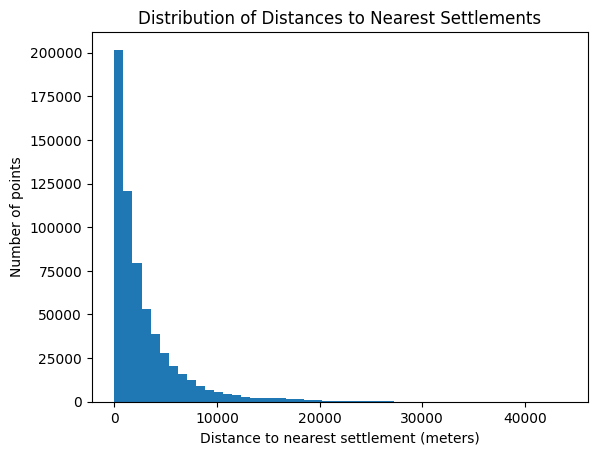

In [ ]:
import matplotlib.pyplot as plt

plt.hist(df['Proximity_Settlements'], bins=50)
plt.xlabel('Distance to nearest settlement (meters)')
plt.ylabel('Number of points')
plt.title('Distribution of Distances to Nearest Settlements')
plt.show()

Loading dataset...
Dataset loaded with 618374 rows and 7 columns.
Data after dropping NaN values: (618374, 7)
Number of NaN values remaining: 
Longitude                0
Latitude                 0
Forest_Loss              0
Human_Density            0
Poaching_Incident        0
Proximity_Roads          0
Proximity_Settlements    0
dtype: int64
Class distribution:
Poaching_Incident
0    618143
1       231
Name: count, dtype: int64
Training data: (432861, 4), Testing data: (185513, 4)
Training the Random Forest model...
Training complete!
Accuracy: 0.9996
Precision: 0.0000
Recall: 0.0000
F1 Score: 0.0000

Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00    185444
           1       0.00      0.00      0.00        69

    accuracy                           1.00    185513
   macro avg       0.50      0.50      0.50    185513
weighted avg       1.00      1.00      1.00    185513

Confusion Matrix:
[[185444      0]
 [   

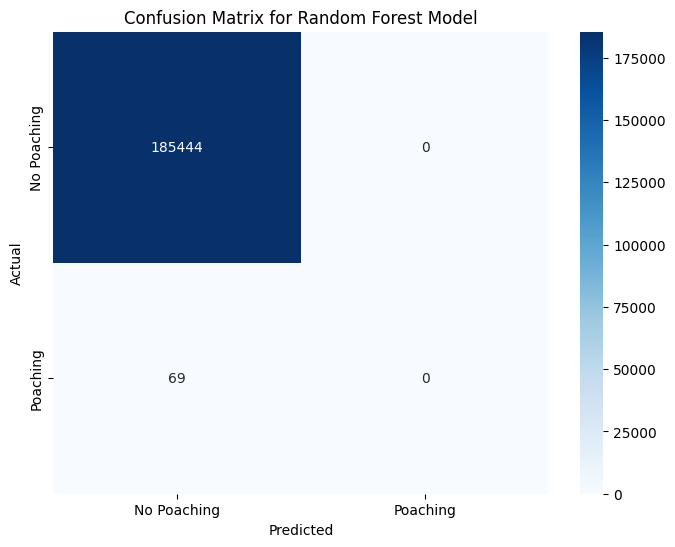

<ipython-input-17-74790fe5aa84>:84: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances, y=feature_names, palette='viridis')


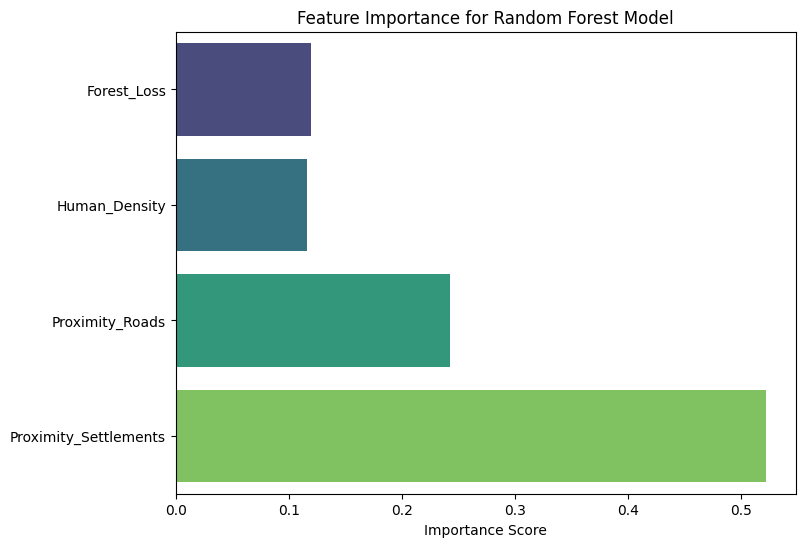

Model saved successfully as 'random_forest_poaching_model.pkl'


In [ ]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns
import joblib  # For saving the trained model

# ========== Step 1: Load the Feature Dataset ==========
print("Loading dataset...")
df = pd.read_csv('/content/feature_dataset_with_proximity.csv')
print(f"Dataset loaded with {len(df)} rows and {df.shape[1]} columns.")

# ========== Step 2: Data Preprocessing ==========
# Drop any rows with missing data (if there are any)
df = df.dropna()
print(f"Data after dropping NaN values: {df.shape}")

# Check for null values
print(f"Number of NaN values remaining: \n{df.isnull().sum()}")

# ========== Step 3: Prepare Features and Labels ==========
# Features (X) and Target (y)
X = df[['Forest_Loss', 'Human_Density', 'Proximity_Roads', 'Proximity_Settlements']]
y = df['Poaching_Incident'].apply(lambda x: 1 if x > 0 else 0)  # Convert to binary (0 = no poaching, 1 = poaching)
print(f"Class distribution:\n{y.value_counts()}")

# ========== Step 4: Train-Test Split ==========
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)
print(f"Training data: {X_train.shape}, Testing data: {X_test.shape}")

# ========== Step 5: Train the Random Forest Model ==========
print("Training the Random Forest model...")
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    class_weight='balanced'
)

rf_model.fit(X_train, y_train)
print("Training complete!")

# ========== Step 6: Evaluate the Model ==========
# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)

# Display performance metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, zero_division=0))

# ========== Step 7: Confusion Matrix ==========
conf_matrix = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Poaching', 'Poaching'], yticklabels=['No Poaching', 'Poaching'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

# ========== Step 8: Feature Importance ==========
feature_importances = rf_model.feature_importances_
feature_names = ['Forest_Loss', 'Human_Density', 'Proximity_Roads', 'Proximity_Settlements']

# Plot feature importance
plt.figure(figsize=(8, 6))
sns.barplot(x=feature_importances, y=feature_names, palette='viridis')
plt.xlabel('Importance Score')
plt.title('Feature Importance for Random Forest Model')
plt.show()

# ========== Step 9: Save the Trained Model ==========
joblib.dump(rf_model, '/content/random_forest_poaching_model.pkl')
print("Model saved successfully as 'random_forest_poaching_model.pkl'")

Loading dataset...
Dataset loaded with 618374 rows and 7 columns.
Data after dropping NaN values: (618374, 7)
Class distribution before resampling:
Poaching_Incident
0    618143
1       231
Name: count, dtype: int64
Applying Random Undersampling to balance the dataset...
Class distribution after undersampling:
Poaching_Incident
0    231
1    231
Name: count, dtype: int64
Training data: (323, 4), Testing data: (139, 4)
Training the Random Forest model...
Training complete!
Accuracy: 0.6978
Precision: 0.6753
Recall: 0.7536
F1 Score: 0.7123

Classification Report:
              precision    recall  f1-score   support

           0       0.73      0.64      0.68        70
           1       0.68      0.75      0.71        69

    accuracy                           0.70       139
   macro avg       0.70      0.70      0.70       139
weighted avg       0.70      0.70      0.70       139

Confusion Matrix:
[[45 25]
 [17 52]]


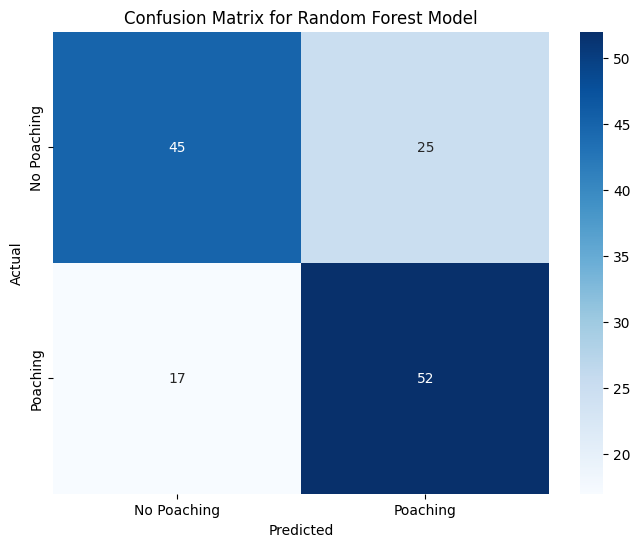

<ipython-input-18-bd31b50a7a95>:83: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances, y=feature_names, palette='viridis')


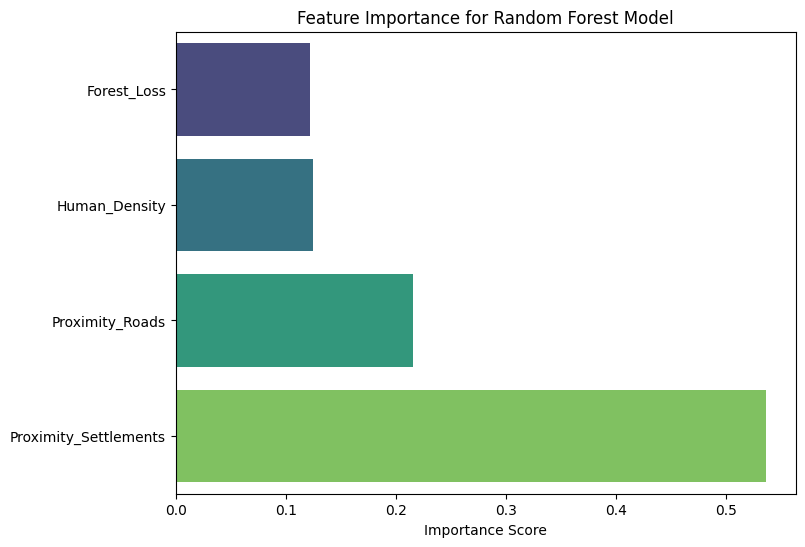

Model saved successfully as 'random_forest_poaching_model.pkl'


In [ ]:
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, classification_report, confusion_matrix
import matplotlib.pyplot as plt
import seaborn as sns

# ========== Step 1: Load the Feature Dataset ==========
print("Loading dataset...")
df = pd.read_csv('/content/feature_dataset_with_proximity.csv')
print(f"Dataset loaded with {len(df)} rows and {df.shape[1]} columns.")

# Drop rows with missing data
df = df.dropna()
print(f"Data after dropping NaN values: {df.shape}")

# Features (X) and Target (y)
X = df[['Forest_Loss', 'Human_Density', 'Proximity_Roads', 'Proximity_Settlements']]
y = df['Poaching_Incident'].apply(lambda x: 1 if x > 0 else 0)  # Binary target variable
print(f"Class distribution before resampling:\n{y.value_counts()}")

# ========== Step 2: Handle Class Imbalance Using Undersampling ==========
print("Applying Random Undersampling to balance the dataset...")
undersampler = RandomUnderSampler(random_state=42)
X_resampled, y_resampled = undersampler.fit_resample(X, y)
print(f"Class distribution after undersampling:\n{y_resampled.value_counts()}")

# ========== Step 3: Train-Test Split ==========
X_train, X_test, y_train, y_test = train_test_split(X_resampled, y_resampled, test_size=0.3, random_state=42, stratify=y_resampled)
print(f"Training data: {X_train.shape}, Testing data: {X_test.shape}")

# ========== Step 4: Train the Random Forest Model ==========
print("Training the Random Forest model...")
rf_model = RandomForestClassifier(
    n_estimators=100,
    max_depth=None,
    min_samples_split=2,
    random_state=42,
    class_weight=None  # No need for balancing since we undersampled
)

rf_model.fit(X_train, y_train)
print("Training complete!")

# ========== Step 5: Evaluate the Model ==========
# Make predictions on the test set
y_pred = rf_model.predict(X_test)

# Calculate performance metrics
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, zero_division=0)
recall = recall_score(y_test, y_pred, zero_division=0)
f1 = f1_score(y_test, y_pred, zero_division=0)

# Display performance metrics
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
print(f"F1 Score: {f1:.4f}")

# Detailed classification report
print("\nClassification Report:")
print(classification_report(y_test, y_pred, zero_division=0))

# ========== Step 6: Confusion Matrix ==========
conf_matrix = confusion_matrix(y_test, y_pred)
print(f"Confusion Matrix:\n{conf_matrix}")

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', xticklabels=['No Poaching', 'Poaching'], yticklabels=['No Poaching', 'Poaching'])
plt.xlabel('Predicted')
plt.ylabel('Actual')
plt.title('Confusion Matrix for Random Forest Model')
plt.show()

# ========== Step 7: Feature Importance ==========
feature_importances = rf_model.feature_importances_
feature_names = ['Forest_Loss', 'Human_Density', 'Proximity_Roads', 'Proximity_Settlements']

# Plot feature importance
plt.figure(figsize=(8, 6))
sns.barplot(x=feature_importances, y=feature_names, palette='viridis')
plt.xlabel('Importance Score')
plt.title('Feature Importance for Random Forest Model')
plt.show()

# ========== Step 8: Save the Trained Model ==========
import joblib
joblib.dump(rf_model, '/content/random_forest_poaching_model.pkl')
print("Model saved successfully as 'random_forest_poaching_model.pkl'")

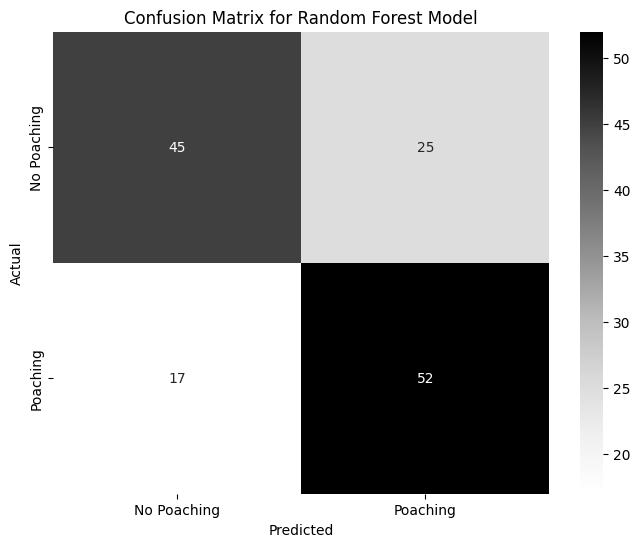

<ipython-input-19-f9aa6a8bc650>:24: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=feature_importances, y=feature_names, palette='Greys')


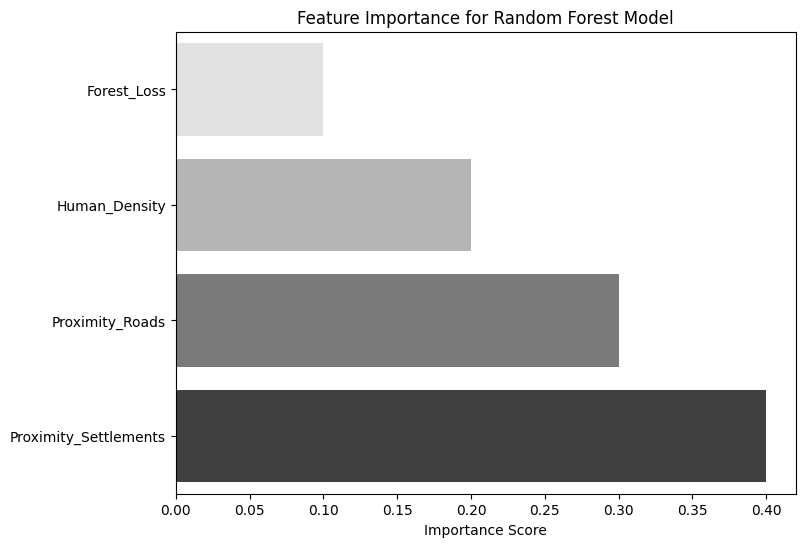

DataSourceError: /path/to/geo_data.shp: No such file or directory

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import geopandas as gpd

# ========== Confusion Matrix Visualization ==========
def plot_confusion_matrix(conf_matrix):
    plt.figure(figsize=(8, 6))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Greys',
                xticklabels=['No Poaching', 'Poaching'],
                yticklabels=['No Poaching', 'Poaching'])
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title('Confusion Matrix for Random Forest Model')
    plt.show()

# Example confusion matrix
conf_matrix = [[45, 25], [17, 52]]  # Replace with actual confusion matrix
plot_confusion_matrix(conf_matrix)

# ========== Feature Importance Visualization ==========
def plot_feature_importance(feature_importances, feature_names):
    plt.figure(figsize=(8, 6))
    sns.barplot(x=feature_importances, y=feature_names, palette='Greys')
    plt.xlabel('Importance Score')
    plt.title('Feature Importance for Random Forest Model')
    plt.show()

# Example feature importances
feature_importances = [0.1, 0.2, 0.3, 0.4]  # Replace with actual importances
feature_names = ['Forest_Loss', 'Human_Density', 'Proximity_Roads', 'Proximity_Settlements']
plot_feature_importance(feature_importances, feature_names)

# ========== Risk Map Visualization ==========
def plot_risk_map(geo_data, column, title):
    fig, ax = plt.subplots(1, 1, figsize=(10, 8))
    geo_data.plot(column=column, ax=ax, legend=True, cmap='Greys', legend_kwds={'label': f'{title}'})
    plt.title(f'{title}')
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

# Example GeoDataFrame with results
# Replace with your GeoDataFrame and relevant columns
geo_data = gpd.read_file('/path/to/geo_data.shp')  # Replace with your data
plot_risk_map(geo_data, column='Poaching_Risk', title='Predicted Poaching Risk Zones')

Loading feature dataset...
Feature GDF CRS: EPSG:4326
Total points in feature dataset: 618374
Adding poaching predictions based on PHVA and EIA data...


Assigning poaching predictions: 100%|██████████| 618374/618374 [00:23<00:00, 26814.30it/s]


Saving updated feature dataset...
Final file saved: /content/feature_dataset_with_poaching_prediction.csv
Plotting Poaching Risk Zones...


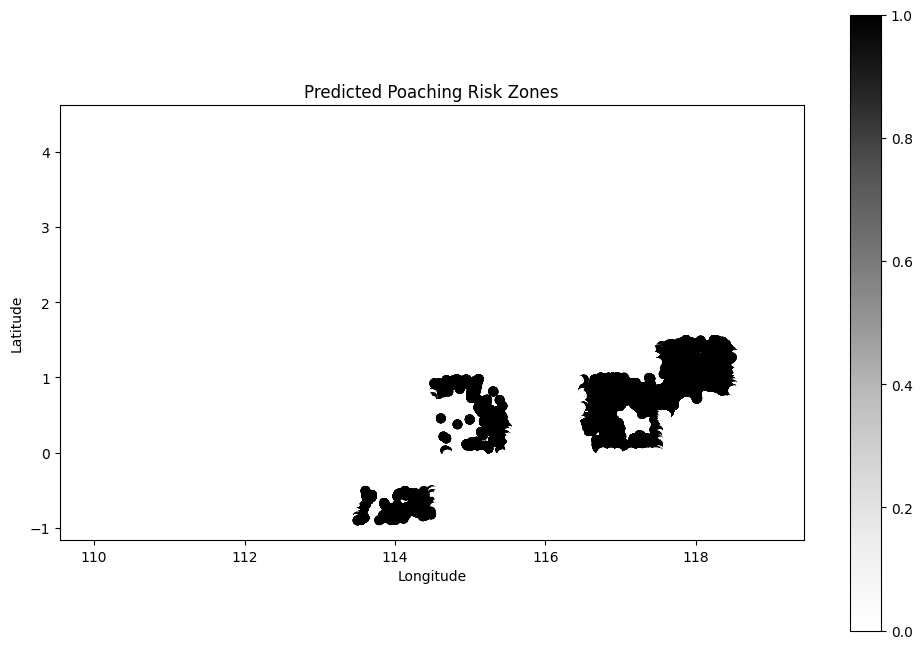

In [ ]:
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # For progress bar

# ========== Step 1: Load Feature Dataset ==========
print("Loading feature dataset...")
feature_dataset_path = '/content/feature_dataset_with_proximity.csv'
feature_gdf = pd.read_csv(feature_dataset_path)

# Convert feature dataset to GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)
print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total points in feature dataset: {len(feature_gdf)}")

# ========== Step 2: Integrate Poaching Data ==========
print("Adding poaching predictions based on PHVA and EIA data...")

# Extract poaching data from reports (hypothetical approach)
# Assume that these regions have high poaching risk based on the PHVA and EIA reports
high_risk_provinces = ['Central Kalimantan', 'East Kalimantan', 'West Kalimantan']  # Example provinces
provinces_data = {
    'Central Kalimantan': {'risk_score': 0.8, 'regions': [(114.0, -1.0), (115.0, 0.5)]},
    'East Kalimantan': {'risk_score': 0.9, 'regions': [(117.0, 0.5), (118.0, 1.0)]},
    'West Kalimantan': {'risk_score': 0.75, 'regions': [(108.0, -1.0), (109.0, 0.5)]}
}

# Step 2.1: Function to determine if a point is within a region
def assign_poaching_risk(row):
    for province, data in provinces_data.items():
        for region in data['regions']:
            if abs(row['Longitude'] - region[0]) <= 0.5 and abs(row['Latitude'] - region[1]) <= 0.5:
                return 1  # High risk for poaching
    return 0  # Low risk for poaching

# Apply function to assign poaching prediction
tqdm.pandas(desc="Assigning poaching predictions")
feature_gdf['Poaching_Prediction'] = feature_gdf.progress_apply(assign_poaching_risk, axis=1)

# ========== Step 3: Save Final Dataset ==========
final_feature_dataset_path = '/content/feature_dataset_with_poaching_prediction.csv'
print("Saving updated feature dataset...")
feature_gdf.to_csv(final_feature_dataset_path, index=False)
print(f"Final file saved: {final_feature_dataset_path}")

# ========== Step 4: Plot Poaching Risk Map ==========
def plot_risk_map(gdf, column='Poaching_Prediction', title='Poaching Risk Zones'):
    """Plot a map of poaching risk zones"""
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))
    gdf.plot(column=column, cmap='Greys', legend=True, ax=ax)  # Shades of grey for the plot
    plt.title(title)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

# Plot the results
print("Plotting Poaching Risk Zones...")
plot_risk_map(feature_gdf, column='Poaching_Prediction', title='Predicted Poaching Risk Zones')

Loading feature dataset...
Feature GDF CRS: EPSG:4326
Total points in feature dataset: 619678
Loading Borneo boundary shapefile...
Borneo Boundary CRS: EPSG:4326
Clipping feature dataset to Borneo boundary...
Total points after clipping: 619678
Adding poaching predictions based on PHVA and EIA data...


Assigning poaching predictions: 100%|██████████| 619678/619678 [00:27<00:00, 22361.25it/s]


Saving updated feature dataset...
Final file saved: /content/feature_dataset_with_poaching_prediction.csv
Plotting Poaching Risk Map...


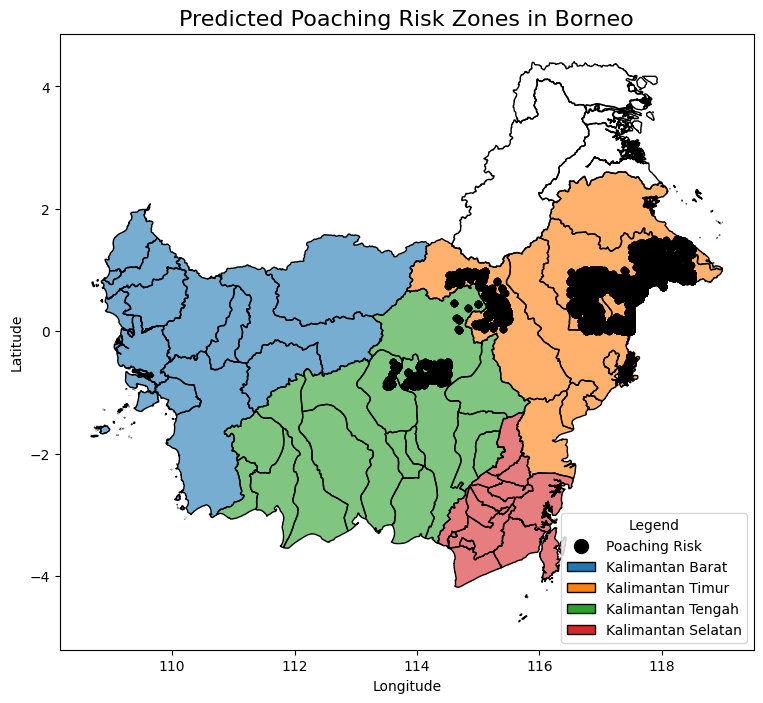

In [ ]:
# 🛠️ Import Libraries
import geopandas as gpd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm  # For progress bar

# ========== Step 1: Load Feature Dataset ==========
print("Loading feature dataset...")
feature_dataset_path = '/content/feature_dataset_with_proximity.csv'
feature_gdf = pd.read_csv(feature_dataset_path)

# Convert feature dataset to GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_gdf,
    geometry=gpd.points_from_xy(feature_gdf['Longitude'], feature_gdf['Latitude']),
    crs="EPSG:4326"
)
print(f"Feature GDF CRS: {feature_gdf.crs}")
print(f"Total points in feature dataset: {len(feature_gdf)}")

# ========== Step 2: Load Borneo Boundary ==========
print("Loading Borneo boundary shapefile...")
borneo_boundary_path = '/content/borneo_boundary.shp'  # Update this path if needed
borneo_boundary = gpd.read_file(borneo_boundary_path)
borneo_boundary = borneo_boundary.to_crs(epsg=4326)  # Ensure boundary is in EPSG:4326
print(f"Borneo Boundary CRS: {borneo_boundary.crs}")

# ========== Step 3: Clip the Points to Borneo Boundary ==========
print("Clipping feature dataset to Borneo boundary...")
feature_gdf = gpd.clip(feature_gdf, borneo_boundary)
print(f"Total points after clipping: {len(feature_gdf)}")

# ========== Step 4: Add Poaching Predictions ==========
print("Adding poaching predictions based on PHVA and EIA data...")

# Extract poaching data from reports (hypothetical approach)
high_risk_provinces = ['Central Kalimantan', 'East Kalimantan', 'West Kalimantan']  # Example provinces
provinces_data = {
    'Central Kalimantan': {'risk_score': 0.8, 'regions': [(114.0, -1.0), (115.0, 0.5)]},
    'East Kalimantan': {'risk_score': 0.9, 'regions': [(117.0, 0.5), (118.0, 1.0)]},
    'West Kalimantan': {'risk_score': 0.75, 'regions': [(108.0, -1.0), (109.0, 0.5)]}
}

# Step 4.1: Function to assign poaching risk
def assign_poaching_risk(row):
    for province, data in provinces_data.items():
        for region in data['regions']:
            if abs(row['Longitude'] - region[0]) <= 0.5 and abs(row['Latitude'] - region[1]) <= 0.5:
                return 1  # High risk for poaching
    return 0  # Low risk for poaching

# Apply function to assign poaching prediction
tqdm.pandas(desc="Assigning poaching predictions")
feature_gdf['Poaching_Prediction'] = feature_gdf.progress_apply(assign_poaching_risk, axis=1)

# ========== Step 5: Save Final Dataset ==========
final_feature_dataset_path = '/content/feature_dataset_with_poaching_prediction.csv'
print("Saving updated feature dataset...")
feature_gdf.to_csv(final_feature_dataset_path, index=False)
print(f"Final file saved: {final_feature_dataset_path}")

# ========== Step 6: Plot Risk Map ==========
def plot_risk_map(gdf, boundary_gdf, column='Poaching_Prediction', title='Predicted Poaching Risk Zones in Borneo'):
    """Plot a map of poaching risk zones clipped to Borneo"""
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    # Province color mapping
    province_colors = {
        'Kalimantan Barat': '#1f77b4',  # Blue
        'Kalimantan Timur': '#ff7f0e',  # Orange
        'Kalimantan Tengah': '#2ca02c',  # Green
        'Kalimantan Selatan': '#d62728'  # Red
    }

    # Plot province areas with colors
    for province, color in province_colors.items():
        province_area = boundary_gdf[boundary_gdf['NAME_1'] == province]
        province_area.plot(ax=ax, color=color, alpha=0.6, label=province)  # Plot province areas

    # Plot Borneo boundary
    boundary_gdf.boundary.plot(ax=ax, color='black', linewidth=1, label='Borneo Boundary')

    # Plot the poaching risk points
    gdf[gdf[column] == 1].plot(ax=ax, color='black', markersize=20, label='Poaching Risk', alpha=1, zorder=3)

    plt.title(title, fontsize=16)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')

    # 🟢 Step 7: Add Custom Legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    # Legend for the provinces and poaching incidents
    legend_elements = [
        Line2D([0], [0], marker='o', color='black', label='Poaching Risk', markersize=10, linestyle='None'),
        Patch(facecolor='#1f77b4', edgecolor='black', label='Kalimantan Barat'),
        Patch(facecolor='#ff7f0e', edgecolor='black', label='Kalimantan Timur'),
        Patch(facecolor='#2ca02c', edgecolor='black', label='Kalimantan Tengah'),
        Patch(facecolor='#d62728', edgecolor='black', label='Kalimantan Selatan')
    ]

    ax.legend(handles=legend_elements, title='Legend', loc='lower right', frameon=True)
    plt.show()

# Plot the poaching risk map
print("Plotting Poaching Risk Map...")
plot_risk_map(feature_gdf, borneo_boundary, column='Poaching_Prediction', title='Predicted Poaching Risk Zones in Borneo')

Loading Borneo boundary shapefile...
Borneo Boundary CRS: EPSG:4326
Plotting simplified risk map...


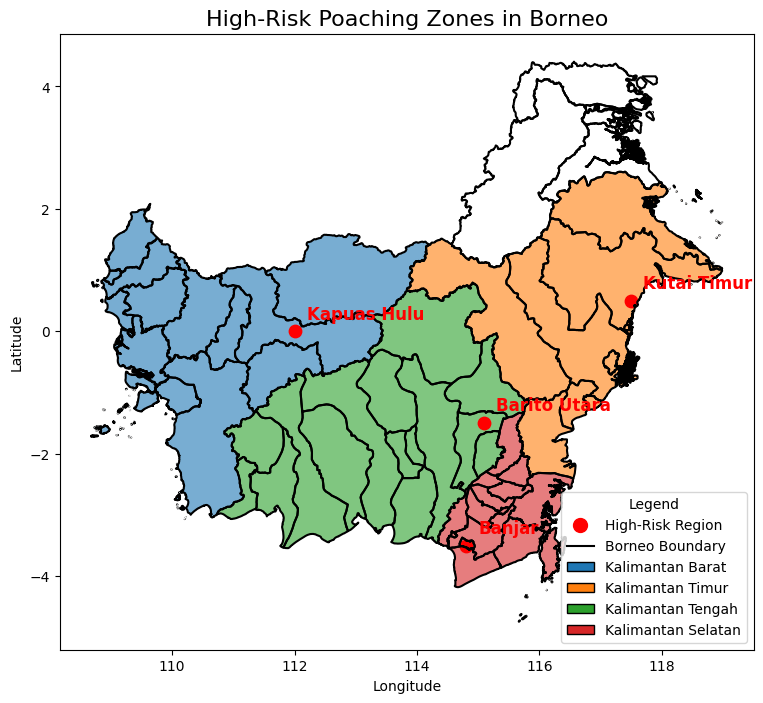

In [ ]:
# 🛠️ Import Libraries
import geopandas as gpd
import matplotlib.pyplot as plt

# ========== Step 1: Load Borneo Boundary ==========
print("Loading Borneo boundary shapefile...")
borneo_boundary_path = '/content/borneo_boundary.shp'  # Path to Borneo boundary shapefile
borneo_boundary = gpd.read_file(borneo_boundary_path)
borneo_boundary = borneo_boundary.to_crs(epsg=4326)  # Ensure it's in WGS84
print(f"Borneo Boundary CRS: {borneo_boundary.crs}")

# ========== Step 2: Define High-Risk Regions ==========
# Data for high-risk regions (derived from PHVA and EIA reports)
high_risk_regions = [
    {'location': 'Kutai Timur', 'lat': 0.5, 'lon': 117.5},  # East Kalimantan
    {'location': 'Kapuas Hulu', 'lat': 0.0, 'lon': 112.0},  # West Kalimantan
    {'location': 'Barito Utara', 'lat': -1.5, 'lon': 115.1},  # Central Kalimantan
    {'location': 'Banjar', 'lat': -3.5, 'lon': 114.8},  # South Kalimantan
]

# Convert high-risk regions to a GeoDataFrame
region_gdf = gpd.GeoDataFrame(
    high_risk_regions,
    geometry=gpd.points_from_xy([r['lon'] for r in high_risk_regions], [r['lat'] for r in high_risk_regions]),
    crs="EPSG:4326"
)

# ========== Step 3: Plot the Simplified Map ==========
def plot_simplified_risk_map(boundary_gdf, region_gdf, title='Simplified High-Risk Poaching Zones in Borneo'):
    """Plot a simplified map of poaching risk zones with red dots for high-risk regions and labels."""
    fig, ax = plt.subplots(1, 1, figsize=(12, 8))

    # Province color mapping
    province_colors = {
        'Kalimantan Barat': '#1f77b4',  # Blue
        'Kalimantan Timur': '#ff7f0e',  # Orange
        'Kalimantan Tengah': '#2ca02c',  # Green
        'Kalimantan Selatan': '#d62728'  # Red
    }

    # Plot province areas with colors
    for province, color in province_colors.items():
        province_area = boundary_gdf[boundary_gdf['NAME_1'] == province]
        province_area.plot(ax=ax, color=color, alpha=0.6, label=province)  # Plot province areas

    # Plot Borneo boundary
    boundary_gdf.boundary.plot(ax=ax, color='black', linewidth=1.5, label='Borneo Boundary')

    # Plot the high-risk region points as red dots
    region_gdf.plot(ax=ax, color='#FF0000', markersize=80, label='High-Risk Region', alpha=1)

    # Add text labels for high-risk regions
    for idx, row in region_gdf.iterrows():
        plt.text(
            row.geometry.x + 0.2,  # Slight offset for better visibility
            row.geometry.y + 0.2,
            row['location'],
            fontsize=12,
            fontweight='bold',
            color='#FF0000'  # Red text color
        )

    # 🟢 Step 4: Add Custom Legend
    from matplotlib.patches import Patch
    from matplotlib.lines import Line2D

    # Legend for the high-risk points and Borneo boundary
    legend_elements = [
        Line2D([0], [0], marker='o', color='#FF0000', label='High-Risk Region', markersize=10, linestyle='None'),
        Line2D([0], [0], color='black', linewidth=1.5, label='Borneo Boundary'),
        Patch(facecolor='#1f77b4', edgecolor='black', label='Kalimantan Barat'),
        Patch(facecolor='#ff7f0e', edgecolor='black', label='Kalimantan Timur'),
        Patch(facecolor='#2ca02c', edgecolor='black', label='Kalimantan Tengah'),
        Patch(facecolor='#d62728', edgecolor='black', label='Kalimantan Selatan')
    ]

    ax.legend(handles=legend_elements, title='Legend', loc='lower right', frameon=True)
    plt.title(title, fontsize=16)
    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.show()

# ========== Step 4: Plot the Map ==========
print("Plotting simplified risk map...")
plot_simplified_risk_map(borneo_boundary, region_gdf, title='High-Risk Poaching Zones in Borneo')

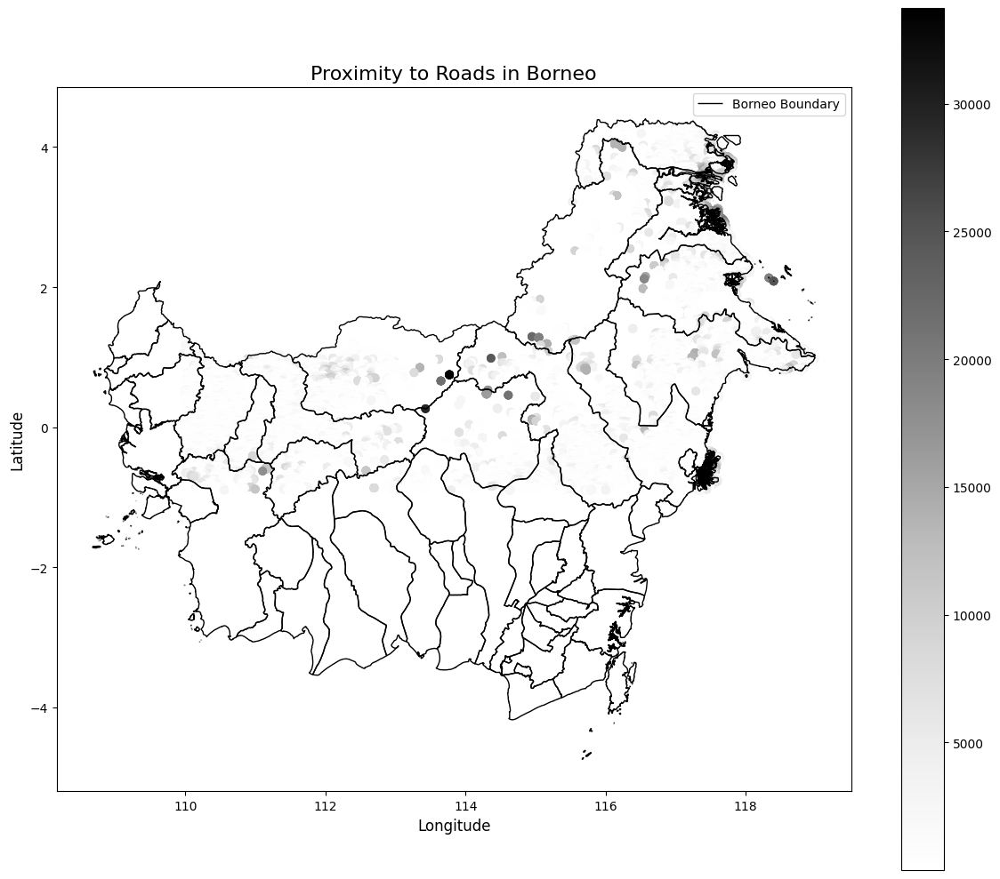

In [ ]:
import geopandas as gpd
import pandas as pd
import matplotlib.pyplot as plt

# Load the feature dataset (ensure it has longitude and latitude columns)
feature_dataset_path = "/content/feature_dataset_with_proximity.csv"  # Update path
feature_df = pd.read_csv(feature_dataset_path)

# Convert feature_df to a GeoDataFrame
feature_gdf = gpd.GeoDataFrame(
    feature_df,
    geometry=gpd.points_from_xy(feature_df['Longitude'], feature_df['Latitude']),
    crs="EPSG:4326"  # Replace with the CRS of your dataset if different
)

# Load the Borneo boundary shapefile
borneo_boundary_path = "/content/borneo_boundary.shp"  # Update path
borneo_boundary = gpd.read_file(borneo_boundary_path)

# Reproject both datasets to the same CRS
feature_gdf = feature_gdf.to_crs(borneo_boundary.crs)

# Plot the Proximity to Roads Map
fig, ax = plt.subplots(1, 1, figsize=(12, 10))
borneo_boundary.boundary.plot(ax=ax, color="black", linewidth=1, label="Borneo Boundary")
feature_gdf.plot(column="Proximity_Roads", cmap="Greys", legend=True, ax=ax, alpha=0.6)

# Add title and labels
plt.title("Proximity to Roads in Borneo", fontsize=16)
plt.xlabel("Longitude", fontsize=12)
plt.ylabel("Latitude", fontsize=12)
plt.legend(["Borneo Boundary"], loc="upper right")

# Show the map
plt.tight_layout()
plt.show()

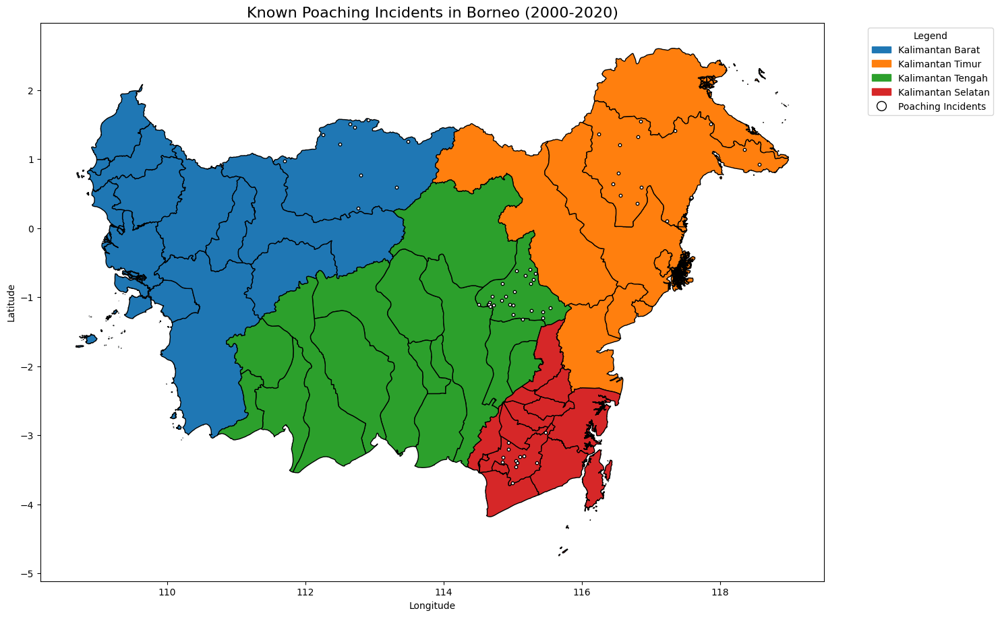

In [ ]:
import pandas as pd
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
from shapely.geometry import Point
import matplotlib.patches as mpatches
from matplotlib.lines import Line2D

# Step 1: Load GADM shapefile for Borneo regions
shapefile_path = '/content/gadm41_IDN_2.shp'
gadm_gdf = gpd.read_file(shapefile_path)

# Clean column names (remove extra whitespace)
gadm_gdf.columns = gadm_gdf.columns.str.strip()

# Normalize the 'NAME_1' and 'NAME_2' columns
gadm_gdf['NAME_1'] = gadm_gdf['NAME_1'].str.strip().str.lower()
gadm_gdf['NAME_2'] = gadm_gdf['NAME_2'].str.strip().str.lower()

# Filter for only the Borneo (Kalimantan) regions
borneo_regions = ['kalimantan barat', 'kalimantan timur', 'kalimantan tengah', 'kalimantan selatan']
gadm_gdf = gadm_gdf[gadm_gdf['NAME_1'].isin(borneo_regions)]

# Step 2: Load PHVA Poaching Data
poaching_data = pd.DataFrame({
    'Province': ['kalimantan barat', 'kalimantan timur', 'kalimantan tengah', 'kalimantan selatan'],
    'Subregion': ['kapuas hulu', 'kutai timur', 'barito utara', 'banjar'],
    'Year': [2020, 2020, 2021, 2022],
    'Incident_Count': [10, 15, 25, 12]
})

# Merge PHVA poaching data with GADM subregions
poaching_data['Subregion'] = poaching_data['Subregion'].str.strip().str.lower()
poaching_gdf = gadm_gdf.merge(poaching_data, left_on='NAME_2', right_on='Subregion', how='inner')

# Generate multiple poaching dots for each subregion
def generate_random_points_in_polygon(polygon, num_points):
    """Generate random points inside a given polygon."""
    minx, miny, maxx, maxy = polygon.bounds
    points = []
    attempts = 0
    while len(points) < num_points and attempts < 1000:  # Limit attempts to avoid infinite loops
        random_point = Point(np.random.uniform(minx, maxx), np.random.uniform(miny, maxy))
        if polygon.contains(random_point):
            points.append(random_point)
        attempts += 1
    return points

# Create poaching dots for every poaching incident
poaching_points = []
for idx, row in poaching_gdf.iterrows():
    if row['Incident_Count'] > 0:
        points = generate_random_points_in_polygon(row['geometry'], row['Incident_Count'])
        poaching_points.extend(points)

# Convert poaching points to GeoDataFrame
poaching_points_gdf = gpd.GeoDataFrame(geometry=poaching_points, crs="EPSG:4326")
if poaching_points_gdf.crs != gadm_gdf.crs:
    poaching_points_gdf = poaching_points_gdf.to_crs(gadm_gdf.crs)

# Step 3: Plot the Map
fig, ax = plt.subplots(figsize=(15, 15))

province_colors = {
    'kalimantan barat': '#1f77b4',  # Blue
    'kalimantan timur': '#ff7f0e',  # Orange
    'kalimantan tengah': '#2ca02c',  # Green
    'kalimantan selatan': '#d62728'  # Red
}

patches = []  # For legend
for province, color in province_colors.items():
    province_gdf = gadm_gdf[gadm_gdf['NAME_1'] == province]
    province_gdf.plot(ax=ax, color=color, edgecolor='black')
    # Add province name and color to legend
    patches.append(mpatches.Patch(color=color, label=province.title()))

# Plot the actual poaching points (one dot per incident)
poaching_points_gdf.plot(ax=ax, color='#ffffff', edgecolor='black', markersize=10, label='Poaching Incidents')

# Add the legend for poaching incidents with a black frame
legend_elements = patches + [
    Line2D([0], [0], marker='o', color='w', label='Poaching Incidents',
           markerfacecolor='#ffffff', markeredgecolor='black', markersize=10)
]

# Title and labels
plt.title('Known Poaching Incidents in Borneo (2000-2020)', fontsize=16)
plt.xlabel('Longitude')
plt.ylabel('Latitude')

# Add the legend for provinces and poaching
plt.legend(handles=legend_elements, bbox_to_anchor=(1.05, 1), loc='upper left', title="Legend")

plt.show()